In [1]:
import pandas as pd
import geopandas as gpd # Used to make location data
import folium
from folium.plugins import HeatMap 
from shapely.geometry import Point # Convert longitude and Latitude to a point
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import pickle as pkl # Serialization

In [2]:
# Variables to help add data into dictionary
borough_list = ['bronx', 'brooklyn', 'manhattan', 'queens', 'statenisland']
date_list = ['2010','2011','2012','2013','2014','2015','2016','2017','2018']
rollingsales_dict = dict() #Dictionary where initial data is stored in

# Using this to rename the columns of each dataframe so that they are uniform
columns = ['BOROUGH',
 'NEIGHBORHOOD',
 'BUILDING CLASS CATEGORY',
 'TAX CLASS AT PRESENT',
 'BLOCK',
 'LOT',
 'EASE-MENT',
 'BUILDING CLASS AT PRESENT',
 'ADDRESS',
 'APARTMENT NUMBER',
 'ZIP CODE',
 'RESIDENTIAL UNITS',
 'COMMERCIAL UNITS',
 'TOTAL UNITS',
 'LAND SQUARE FEET',
 'GROSS SQUARE FEET',
 'YEAR BUILT',
 'TAX CLASS AT TIME OF SALE',
 'BUILDING CLASS AT TIME OF SALE',
 'SALE PRICE',
 'SALE DATE']

# Read date into dictionary (Takes a while to load in) Also cleans the data
for date in date_list:
    for borough in borough_list:
        
        # Read in data
        rollingsales_dict[borough+date] = pd.read_excel("data/rollingsales/"+date+"/"+date+"_"+borough+".xls")
        # First few rows are dataframe information not actual data so they are dropped
        if date == '2010':
            rollingsales_dict[borough+date].columns = columns
            rollingsales_dict[borough+date].drop([0,1,2], inplace=True)
        else:
            rollingsales_dict[borough+date].columns = columns
            rollingsales_dict[borough+date].drop([0,1,2,3], inplace=True)
        
        # Drop redundant or useless columns to make things easier to look at
        rollingsales_dict[borough+date].drop(['EASE-MENT','TOTAL UNITS'], axis=1, inplace=True)
        
        # Drop row duplicates, keep only the last seen instance
        rollingsales_dict[borough+date].drop_duplicates(inplace=True, subset=["ADDRESS", "APARTMENT NUMBER"], keep="last")

In [3]:
rollingsales_dict["queens2018"].head(3)

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
4,4,AIRPORT LA GUARDIA,01 ONE FAMILY DWELLINGS,1,976,29,A5,21-48 81ST STREET,,11370,1,0,1800,1224,1950,1,A5,730000,2018-07-19 00:00:00
5,4,AIRPORT LA GUARDIA,01 ONE FAMILY DWELLINGS,1,976,33,A5,21-56 81ST STREET,,11370,1,0,1800,1224,1950,1,A5,0,2018-10-12 00:00:00
6,4,AIRPORT LA GUARDIA,01 ONE FAMILY DWELLINGS,1,976,68,A5,21-07 80 STREET,,11370,1,0,1800,1224,1950,1,A5,822500,2018-11-21 00:00:00


Generally speaking, bigger houses are usually more expensive, however, can we find other features that may determine the price of a home?

In [4]:
rollingsales_dict["queens2018"].describe()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
count,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326,24326
unique,1,60,39,11,7980,1130,116,22326,1189,64,77,28,3434,3221,119,3,115,3213,350
top,4,FLUSHING-NORTH,01 ONE FAMILY DWELLINGS,1,5066,1,A1,25-19 43RD AVENUE,,11375,1,0,0,0,1920,1,A1,0,2018-06-28 00:00:00
freq,24326,2329,8249,14577,175,1633,3924,67,21319,1099,10571,22534,6287,6353,2360,15329,3929,7092,161


We can see that a large portion of the sale prices are 0. This is most likely because the exact sale price isn't known. The majority of the homes present are single family dwellings however from the sales with similar addresses we also know that there are apartment rooms sold as well. However there are also prices that are very low such as $1, 99.99 percent of the time, these are title transfers or passing of the property from one owner to another without a "sale". We will have to remove these datas to avoid skewing the data.

In [5]:
# Fill in the NaNs of land and gross square feet by their average borough sq ft data

for bor in borough_list:
    for date in date_list:
        # Average land and gross square feet
        avg_land_sqft = np.mean(rollingsales_dict[bor+date][rollingsales_dict[bor+date]['LAND SQUARE FEET'] != 0]['LAND SQUARE FEET'])
        avg_gross_sqft = np.mean(rollingsales_dict[bor+date][rollingsales_dict[bor+date]['GROSS SQUARE FEET'] != 0]['GROSS SQUARE FEET'])
        
        # Round the averages
        avg_land_sqft = np.round(avg_land_sqft)
        avg_gross_sqft = np.round(avg_gross_sqft)
        
        # Fill in land and gross square feet data
        rollingsales_dict[bor+date]['LAND SQUARE FEET'] = rollingsales_dict[bor+date]['LAND SQUARE FEET'].mask(
            rollingsales_dict[bor+date]['LAND SQUARE FEET'] == 0, avg_land_sqft)
        rollingsales_dict[bor+date]['GROSS SQUARE FEET'] = rollingsales_dict[bor+date]['GROSS SQUARE FEET'].mask(
            rollingsales_dict[bor+date]['GROSS SQUARE FEET'] == 0, avg_gross_sqft)

In [6]:
np.round(87.4)

87.0

In [7]:
# Time series of sales of NYC
borough_plot_list = dict() 

# Number of home sales for each year in each borough
for borough in borough_list:
    borough_plot_list[borough] = [len(rollingsales_dict[borough+date]) for date in date_list]

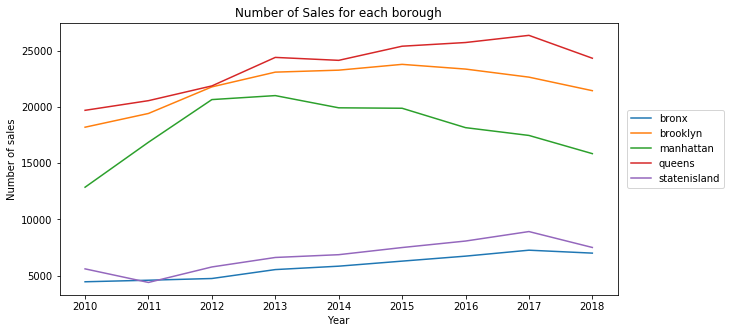

In [8]:
# Plot for total number of sales in each borough
plt.figure(figsize=(10,5))
plt.title("Number of Sales for each borough")

for borough in borough_list:
    plt.plot(date_list, borough_plot_list[borough])

plt.legend(labels=borough_list, loc='upper right', bbox_to_anchor=(1.2, 0.7))
plt.ylabel("Number of sales")
plt.xlabel("Year")
plt.show()

From prior research we know  that the Number of households for each borough are as follows: 

###### Bronx: 503,985 
###### Brooklyn: 956,223 
###### Manhattan: 764,218 
###### Queens: 769,258 
###### Staten Island: 165,990


Using this knowledge we can see that Queens seems to be doing very well for home sales. Bronx is doing relatively poorly if we look at the amount of houses sold and the total number of households.

In [9]:
rollingsales_dict["queens2018"]["SALE PRICE"].astype(int).describe()

count    2.432600e+04
mean     5.828510e+05
std      3.986708e+06
min      0.000000e+00
25%      0.000000e+00
50%      3.730000e+05
75%      7.100000e+05
max      4.750000e+08
Name: SALE PRICE, dtype: float64

In [10]:
# We have to seperate the rows whose sale prices are unknown, we will use the unknown ones as a seperate test in the future
rs_dict_unknown = dict() # Rolling sales with unknown sale prices, (Sale price under $50,000, anything under 50,000 I am doubtful is an actual sale)

for borough in borough_list:
    for date in date_list:
        rs_dict_unknown[borough+date] = rollingsales_dict[borough+date][rollingsales_dict[borough+date]['SALE PRICE'] <= 50000]
        rollingsales_dict[borough+date] = rollingsales_dict[borough+date][rollingsales_dict[borough+date]['SALE PRICE'] > 50000]

In [11]:
# Find out the average sales price of each borough
borough_plot_list = dict() # Borough dictionary with the average sales of each borough in list format

# Number of home sales for each year in each borough
for borough in borough_list:
    borough_plot_list[borough] = [rollingsales_dict[borough+date]["SALE PRICE"].mean() for date in date_list]

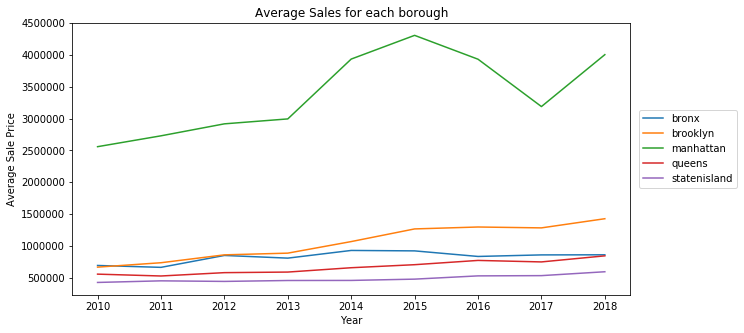

In [12]:
# Plot for average sales in each borough
plt.figure(figsize=(10,5))
plt.title("Average Sales for each borough")

for borough in borough_list:
    plt.plot(date_list, borough_plot_list[borough])

plt.legend(labels=borough_list, loc='upper right', bbox_to_anchor=(1.2, 0.7))
plt.ylabel("Average Sale Price")
plt.xlabel("Year")
plt.show()

#### From the graph above, we can see that brooklyn slowly grew in price from 2010-2018, Manhattan had a big jump in price from 2013-2015 but fell down, only to make another jump on 2018. Queens also saw a small climb upwards albeit not as much as Brooklyn.

#### For this project, I will add on sub datasets into the main dataset, for each dataset, I will do some feature engineering and choose what I think is important to include the main dataset

***
# Rodent Data

In [13]:
# Read in rodent sighting data, data was obtained from NYC Open Data: https://data.cityofnewyork.us/Social-Services/Rodent-Map/mxzz-tj5r/data
rat_sightings = pd.read_csv("data/Rat_Sightings.csv", sep=',', error_bad_lines=False, index_col=False, dtype='unicode')

In [14]:
# Check rat_sightings info 
rat_sightings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123947 entries, 0 to 123946
Data columns (total 38 columns):
Unique Key                        123947 non-null object
Created Date                      123947 non-null object
Closed Date                       110031 non-null object
Agency                            123947 non-null object
Agency Name                       123947 non-null object
Complaint Type                    123947 non-null object
Descriptor                        123947 non-null object
Location Type                     123941 non-null object
Incident Zip                      123528 non-null object
Incident Address                  113436 non-null object
Street Name                       113435 non-null object
Cross Street 1                    100316 non-null object
Cross Street 2                    100278 non-null object
Intersection Street 1             10321 non-null object
Intersection Street 2             10321 non-null object
Address Type                      12

In [15]:
#Remove all the entries that do not have latitude and longitude data
rat_sightings = rat_sightings.dropna(axis=1, how='all')

In [16]:
rat_sightings_count = rat_sightings.groupby(['Borough']).size().reset_index(name='Count')[0:5] # Show only the 5 boroughs (6th column is the undefined ones)

In [17]:
# Check total rodent reports
rat_sightings_count

,Borough,Count
0,BRONX,24787
1,BROOKLYN,42979
2,MANHATTAN,32262
3,QUEENS,18071
4,STATEN ISLAND,5833


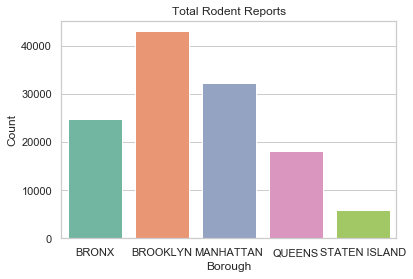

In [18]:
# Plot total rodent reports
sns.set(style="whitegrid")
ax = sns.barplot(x='Borough',y='Count', data=rat_sightings_count,palette="Set2").set_title('Total Rodent Reports')

In [19]:
rat_sightings['Longitude'].astype(float).mean()

-73.93420168780993

In [20]:
rat_sightings['Location'] = list(zip(rat_sightings.Longitude.astype(float), rat_sightings.Latitude.astype(float)))

In [21]:
rat_sightings.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,01/01/2010 11:20:45 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,"(-73.80929891501533, 40.73998332248969)"
1,15633304,01/02/2010 12:50:36 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,"(-73.97698314758436, 40.74316088098852)"
2,15633594,01/01/2010 03:05:37 PM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,"(-73.90361811283164, 40.756986581184535)"


In [22]:
# Preprocessing work for heatmap
rat_sightings['Location'] = rat_sightings['Location'].apply(Point)
geo_rat_sightings = gpd.GeoDataFrame(rat_sightings, geometry='Location')

In [23]:
# Get rid of rows that don't have longitude and latitude
geo_rat_sightings.dropna(subset=['Longitude','Latitude'], how='all', inplace=True)

In [24]:
# Check data is applied correctly
geo_rat_sightings.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,01/01/2010 11:20:45 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
1,15633304,01/02/2010 12:50:36 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,POINT (-73.97698314758436 40.74316088098852)
2,15633594,01/01/2010 03:05:37 PM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)


In [25]:
# Show Heat map of NYC for all dates
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10) # Initial Map of NYC - Heatmap will be added to this
# plot heatmap, folium only allows a certain amount of points so I decided to show only first 30,000
rat_lat = geo_rat_sightings[:]['Latitude'].astype(float)[:30000] 
rat_lon = geo_rat_sightings[:]['Longitude'].astype(float)[:30000]
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [26]:
#Convert a column to a datetime
geo_rat_sightings['Created Date'] = pd.to_datetime(geo_rat_sightings['Created Date'])

In [27]:
#Check the date range
geo_rat_sightings['Created Date'].describe()

count                  123080
unique                  11175
top       2017-02-15 00:00:00
freq                      177
first     2010-01-01 08:29:58
last      2018-12-30 01:19:55
Name: Created Date, dtype: object

In [28]:
geo_rat_sightings.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,2010-01-01 11:20:45,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
1,15633304,2010-01-02 00:50:36,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,POINT (-73.97698314758436 40.74316088098852)
2,15633594,2010-01-01 15:05:37,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)


In [29]:
#Seperate yearly dates into a dictionary to use for the heatmap
geo_rat_sightings_dates = dict()
for i in date_list:
    geo_rat_sightings_dates[i] = geo_rat_sightings[geo_rat_sightings['Created Date'].dt.year == int(i)]
geo_rat_sightings_dates["2010"].head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,2010-01-01 11:20:45,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
1,15633304,2010-01-02 00:50:36,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,POINT (-73.97698314758436 40.74316088098852)
2,15633594,2010-01-01 15:05:37,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)


In [30]:
# This function creates and displays a heat map for the rodent data
def create_rodent_heat_map(location, date, intensity=0.01, dataframe=geo_rat_sightings_dates):
    # Clear heat map
    hmap = folium.Map(location = [location[0], location[1]], zoom_start = 10)
    # plot heatmap
    rat_lat = dataframe[date]['Latitude'].astype(float)
    rat_lon = dataframe[date]['Longitude'].astype(float)
    hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [intensity for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays
    display(hmap)

In [31]:
# Show heat maps for 2010 to 2018
for date in date_list:
    create_rodent_heat_map(location=[40.778,-73.88], date=date)

![Rodent_heatmap_2010-2018](gifs/heatmap_rodents10-18.gif "Rodent_heatmap_2010-2017")

##### We can see a clear increase of rodent calls as the years increase. However 2018 there hasn't been as much rodent reports as the previous years. NYC has been enacting some projects to stop rodents, this could be due to those projects or some other factor, we will not know for sure.

In [32]:
geo_rat_sightings.groupby(['Incident Zip']).size().reset_index(name='Count').head(3)

,Incident Zip,Count
0,00083,26
1,10000,3
2,10001,484


In [33]:
# Organize geo data into borough+date dictionary
borough_list_rodent = ["BRONX","BROOKLYN","MANHATTAN", "QUEENS", "STATEN ISLAND"] # Used for for-loop

rodent_time_series = dict()
# Fill dictionary with borough + date times
for date in date_list:
    for borough in borough_list_rodent:
        rodent_time_series[borough+date] = geo_rat_sightings_dates[date][geo_rat_sightings_dates[date]['Borough'] == borough]

In [34]:
# Check Queens data
geo_rat_sightings_dates["2010"][geo_rat_sightings_dates["2010"]['Borough'] == 'QUEENS'].head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,2010-01-01 11:20:45,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
2,15633594,2010-01-01 15:05:37,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)
12,15636547,2010-01-02 09:38:29,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Other (Explain Below),11432,NaN,...,01/24/2010 04:08:14 AM,12 QUEENS,QUEENS,1039647,195586,Unspecified,QUEENS,40.70334174980328,-73.80020318978804,POINT (-73.80020318978804 40.70334174980328)


In [35]:
zipcode_count = geo_rat_sightings.groupby(['Incident Zip']).size().reset_index(name='Count')
zipcode_count.head(3)

,Incident Zip,Count
0,00083,26
1,10000,3
2,10001,484


In [36]:
# Seperate the count of rodent infestations by date and borough
zipcode_count_dict = dict()

for date in date_list:
    for rodent_borough, borough in zip(borough_list_rodent, borough_list):
        # Dataframe to store 
        _df = geo_rat_sightings_dates[date].groupby(["Incident Zip", "Borough"]).size().reset_index(name='Count') # Dataframe of counts of each zipcode for that date
        _df = _df[_df["Borough"] == rodent_borough] # Filter out the borough
        zipcode_count_dict[borough+date] = _df # Add borough data to dictionary
        zipcode_count_dict[borough+date]['Incident Zip'] = zipcode_count_dict[borough+date]['Incident Zip'].astype(int)


In [37]:
# Rolling sales merged
rs_merged_dict = dict()

# Merge zipcode data 
for borough in borough_list:
    for date in date_list:
        rollingsales_dict[borough+date]['ZIP CODE'] = rollingsales_dict[borough+date]['ZIP CODE'].astype(int)
        rs_merged_dict[borough+date] = rollingsales_dict[borough+date].merge(zipcode_count_dict[borough+date],how="left", right_on="Incident Zip", left_on="ZIP CODE")
        # Code below crashes the plots later
        # rs_merged_dict[borough+date].drop(axis=1, labels=["BOROUGH", "Incident Zip"], inplace=True) # Drop redundant data columns

In [38]:
rs_merged_dict["bronx2010"]['ZIP CODE'].describe()

count     2642.000000
mean     10460.283497
std        203.665788
min          0.000000
25%      10461.000000
50%      10465.000000
75%      10469.000000
max      10475.000000
Name: ZIP CODE, dtype: float64

In [39]:
rs_merged_dict["queens2010"].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12365 entries, 0 to 12364
Data columns (total 22 columns):
BOROUGH                           12365 non-null object
NEIGHBORHOOD                      12365 non-null object
BUILDING CLASS CATEGORY           12365 non-null object
TAX CLASS AT PRESENT              12365 non-null object
BLOCK                             12365 non-null object
LOT                               12365 non-null object
BUILDING CLASS AT PRESENT         12365 non-null object
ADDRESS                           12365 non-null object
APARTMENT NUMBER                  12365 non-null object
ZIP CODE                          12365 non-null int32
RESIDENTIAL UNITS                 12365 non-null object
COMMERCIAL UNITS                  12365 non-null object
LAND SQUARE FEET                  12365 non-null object
GROSS SQUARE FEET                 12365 non-null object
YEAR BUILT                        12365 non-null object
TAX CLASS AT TIME OF SALE         12365 non-null obj

In [40]:
# Fill in missing borough data
for date in date_list:
    for rodent_borough, borough in zip(borough_list_rodent, borough_list):
        rs_merged_dict[borough+date].fillna(value={'Borough':rodent_borough},inplace=True)

Correlation for BRONX is: 0.522256 with a p value of 0.007405
Correlation for BROOKLYN is: 0.030956 with a p value of 0.853626
Correlation for MANHATTAN is: -0.418309 with a p value of 0.006495
Correlation for QUEENS is: 0.048196 with a p value of 0.719392
Correlation for STATEN ISLAND is: 0.100614 with a p value of 0.755707


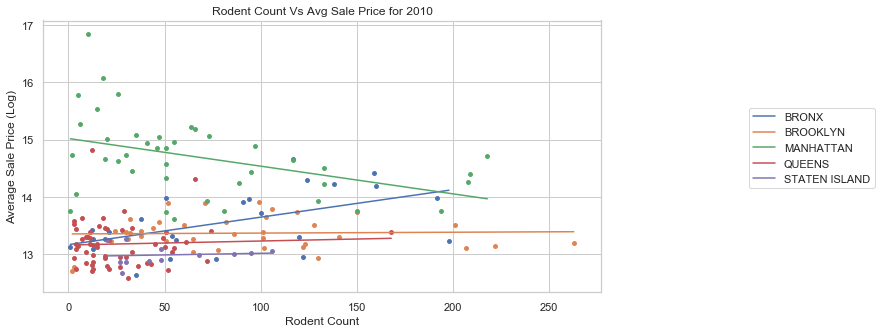

Correlation for BRONX is: 0.306306 with a p value of 0.136439
Correlation for BROOKLYN is: 0.048525 with a p value of 0.775490
Correlation for MANHATTAN is: -0.336233 with a p value of 0.029473
Correlation for QUEENS is: 0.210246 with a p value of 0.109977
Correlation for STATEN ISLAND is: -0.029638 with a p value of 0.927148


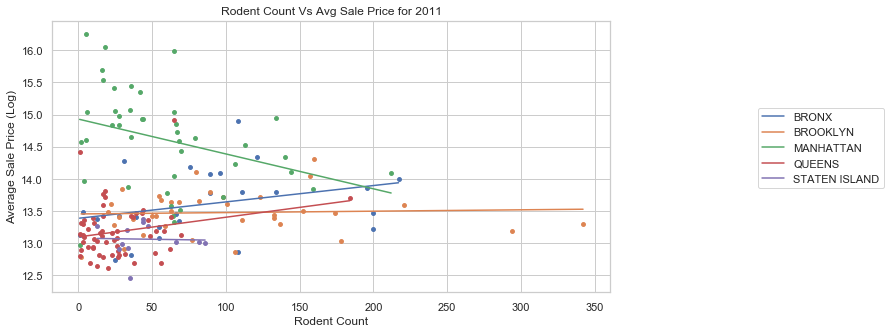

Correlation for BRONX is: 0.386829 with a p value of 0.056101
Correlation for BROOKLYN is: -0.068268 with a p value of 0.688071
Correlation for MANHATTAN is: -0.263906 with a p value of 0.091262
Correlation for QUEENS is: 0.128024 with a p value of 0.338201
Correlation for STATEN ISLAND is: 0.294819 with a p value of 0.352242


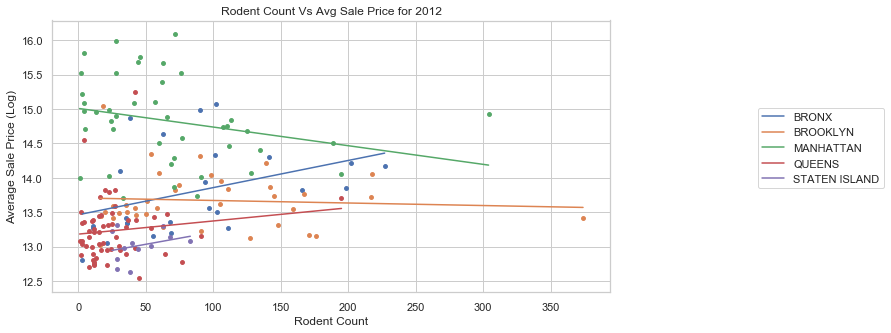

Correlation for BRONX is: 0.590032 with a p value of 0.001906
Correlation for BROOKLYN is: -0.078840 with a p value of 0.637996
Correlation for MANHATTAN is: -0.367017 with a p value of 0.016809
Correlation for QUEENS is: 0.231308 with a p value of 0.077953
Correlation for STATEN ISLAND is: 0.195378 with a p value of 0.542832


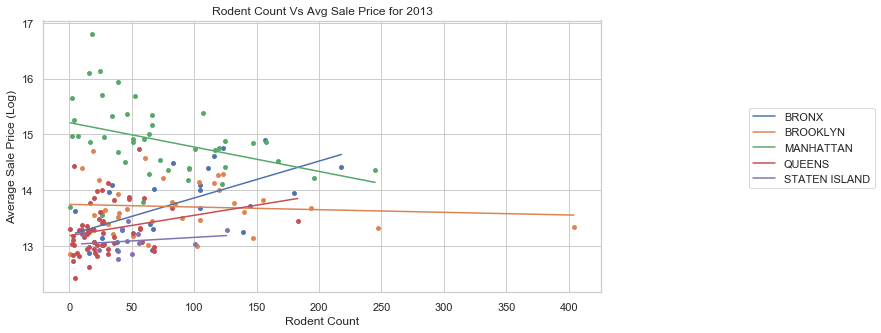

Correlation for BRONX is: 0.608856 with a p value of 0.001238
Correlation for BROOKLYN is: 0.167333 with a p value of 0.322215
Correlation for MANHATTAN is: -0.016441 with a p value of 0.915644
Correlation for QUEENS is: 0.245423 with a p value of 0.060991
Correlation for STATEN ISLAND is: -0.209437 with a p value of 0.513568


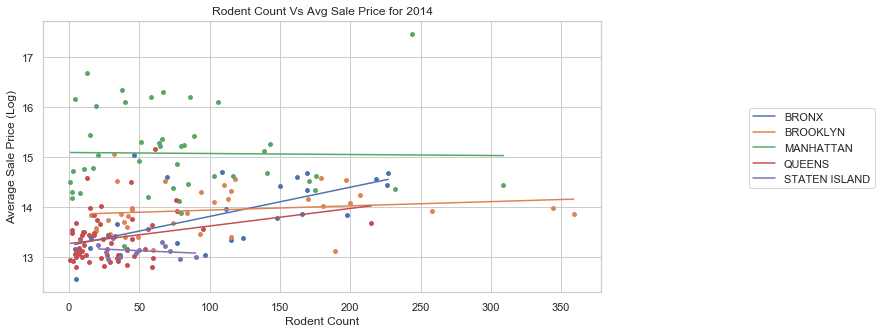

Correlation for BRONX is: 0.476163 with a p value of 0.016121
Correlation for BROOKLYN is: 0.211466 with a p value of 0.202489
Correlation for MANHATTAN is: -0.177536 with a p value of 0.254722
Correlation for QUEENS is: 0.336741 with a p value of 0.009747
Correlation for STATEN ISLAND is: -0.222706 with a p value of 0.486597


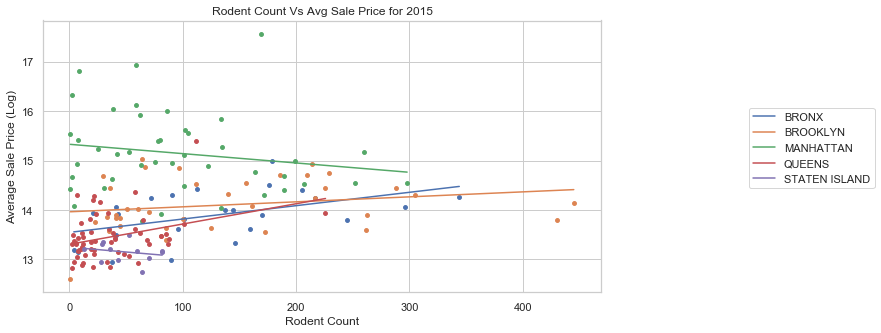

Correlation for BRONX is: 0.289812 with a p value of 0.159948
Correlation for BROOKLYN is: 0.215335 with a p value of 0.200561
Correlation for MANHATTAN is: -0.277366 with a p value of 0.068331
Correlation for QUEENS is: 0.250378 with a p value of 0.053671
Correlation for STATEN ISLAND is: 0.062686 with a p value of 0.846540


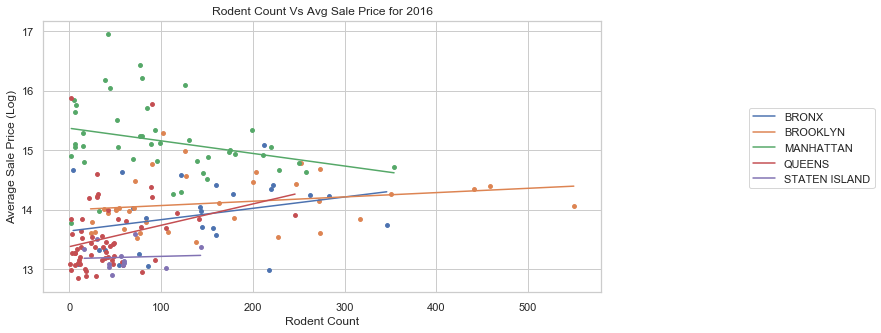

Correlation for BRONX is: 0.337462 with a p value of 0.098998
Correlation for BROOKLYN is: 0.216280 with a p value of 0.198545
Correlation for MANHATTAN is: -0.332847 with a p value of 0.027267
Correlation for QUEENS is: 0.237524 with a p value of 0.067640
Correlation for STATEN ISLAND is: -0.290958 with a p value of 0.358879


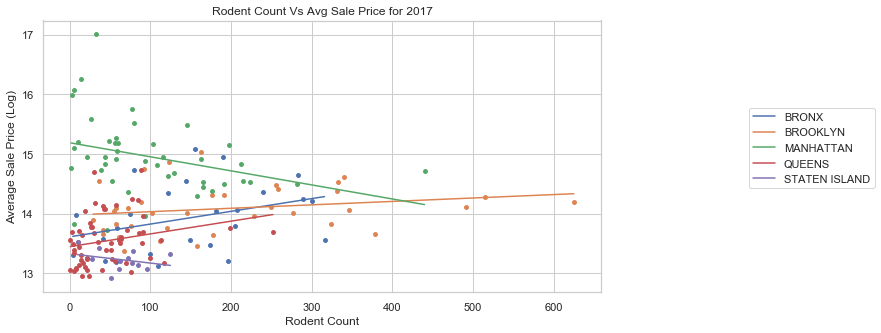

Correlation for BRONX is: 0.458785 with a p value of 0.021068
Correlation for BROOKLYN is: -0.088937 with a p value of 0.595428
Correlation for MANHATTAN is: -0.109781 with a p value of 0.478085
Correlation for QUEENS is: 0.451622 with a p value of 0.000229
Correlation for STATEN ISLAND is: -0.248796 with a p value of 0.435529


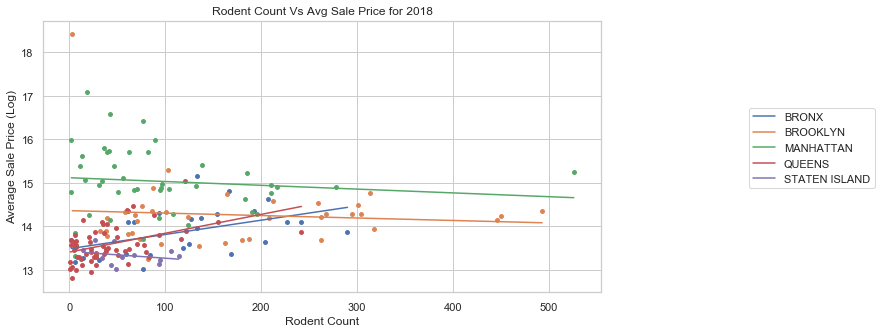

In [41]:
# Visualize correlation between rodent reports and sale prices.
for date in date_list:
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(111)
    plt.title("Rodent Count Vs Avg Sale Price for "+date)
    for rodent_borough, borough in zip(borough_list_rodent, borough_list):
        # Rodent Count
        x = (rs_merged_dict[borough+date].groupby(["ZIP CODE", "SALE PRICE", "Count", "Borough"], as_index=False).mean()).drop_duplicates(['ZIP CODE'])['Count']
        # Average Sale Price for each zipcode and borough
        y = np.log(rs_merged_dict[borough+date].groupby(["ZIP CODE", "SALE PRICE", "Count", "Borough"], as_index=False).mean().groupby(['ZIP CODE','Count', 'Borough'])['SALE PRICE'].mean())
        
        # Regression line
        plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))
        
        # Correlation and p value
        stat = stats.pearsonr(x,y)
        print("Correlation for %s is: %f with a p value of %f"%(rodent_borough, stat[0], stat[1]))
        
        ax1.scatter(x, y, label=rodent_borough, marker='o',s=15)   
        plt.xlabel("Rodent Count")
        plt.ylabel("Average Sale Price (Log)")
    plt.legend(borough_list_rodent, loc='upper right', bbox_to_anchor=(1.5, 0.7))
    plt.show()

#### The average sale price seemed to have exponential variance so I decided to use the log of it to decrease the variance of sale prices. From the graphs above, we can see that some of the boroughs have a significant correlation between rodent count and the average sale price. In the Bronx and Queens interestingly, the more expensive areas have a higher amount of rodent reports, where as in Manhattan it the opposite is true.

In [42]:
# Since we will add more features, it's a good idea to change the column name of Count to Rodent Count
for borough in borough_list:
    for date in date_list:
        rs_merged_dict[borough+date].rename(index=str, columns={'Count':'Rodent Count'}, inplace=True)

#### From a first observation look it seems that higher sale prices generally mean less expensive houses, however there is a huge skew in the data to the the bottom left, so it is hard to determine anything. However, after taking the log of the sales price we made the graph less condensed and made the outliers less impactful. However even after taking the long, it is still hard to see a correlation, and the slightly correlation might be due to a confounding variable.

***

# Crime Data

In [43]:
# Read in Crime data
df_crime = pd.read_csv("data/crime.csv")

df_crime.head(3)

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,RPT_DT,KY_CD,OFNS_DESC,PD_CD,PD_DESC,...,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,PARKS_NM,HADEVELOPT,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
0,457872064,06/30/2018,23:30:00,06/30/2018,23:40:00,06/30/2018,578,HARRASSMENT 2,637.0,"HARASSMENT,SUBD 1,CIVILIAN",...,113,NaN,STREET,NaN,NaN,1048111.0,188479.0,40.683786,-73.769746,"(40.68378593, -73.769745503)"
1,271939965,06/30/2018,23:20:00,06/30/2018,23:25:00,06/30/2018,578,HARRASSMENT 2,637.0,"HARASSMENT,SUBD 1,CIVILIAN",...,115,INSIDE,FAST FOOD,NaN,NaN,1017940.0,214837.0,40.756298,-73.878397,"(40.756298483, -73.878397328)"
2,862644726,06/30/2018,23:09:00,06/30/2018,23:25:00,06/30/2018,343,OTHER OFFENSES RELATED TO THEF,478.0,"THEFT OF SERVICES, UNCLASSIFIE",...,94,FRONT OF,TAXI (LIVERY LICENSED),NaN,NaN,997245.0,204130.0,40.726965,-73.953117,"(40.726965067, -73.953116629)"


In [44]:
df_crime.columns

Index(['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'CMPLNT_TO_DT',
       'CMPLNT_TO_TM', 'RPT_DT', 'KY_CD', 'OFNS_DESC', 'PD_CD', 'PD_DESC',
       'CRM_ATPT_CPTD_CD', 'LAW_CAT_CD', 'JURIS_DESC', 'BORO_NM',
       'ADDR_PCT_CD', 'LOC_OF_OCCUR_DESC', 'PREM_TYP_DESC', 'PARKS_NM',
       'HADEVELOPT', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude',
       'Lat_Lon'],
      dtype='object')

In [45]:
# Drop columns that are not useful
df_crime_drop = df_crime.drop(axis=1, labels=['CMPLNT_FR_TM', 'CMPLNT_TO_DT',
       'CMPLNT_TO_TM', 'RPT_DT', 'KY_CD','CRM_ATPT_CPTD_CD', 'JURIS_DESC', 'PARKS_NM', 'HADEVELOPT', 'X_COORD_CD', 'Y_COORD_CD', 'Lat_Lon'])

In [46]:
df_crime_drop.head(3)

,CMPLNT_NUM,CMPLNT_FR_DT,OFNS_DESC,PD_CD,PD_DESC,LAW_CAT_CD,BORO_NM,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,Latitude,Longitude
0,457872064,06/30/2018,HARRASSMENT 2,637.0,"HARASSMENT,SUBD 1,CIVILIAN",VIOLATION,QUEENS,113,NaN,STREET,40.683786,-73.769746
1,271939965,06/30/2018,HARRASSMENT 2,637.0,"HARASSMENT,SUBD 1,CIVILIAN",VIOLATION,QUEENS,115,INSIDE,FAST FOOD,40.756298,-73.878397
2,862644726,06/30/2018,OTHER OFFENSES RELATED TO THEF,478.0,"THEFT OF SERVICES, UNCLASSIFIE",MISDEMEANOR,BROOKLYN,94,FRONT OF,TAXI (LIVERY LICENSED),40.726965,-73.953117


In [47]:
# Total Crime for each borough
crime_count_borough = df_crime_drop.groupby(['BORO_NM']).size().reset_index(name='Count')
crime_count_borough

,BORO_NM,Count
0,BRONX,50153
1,BROOKLYN,67489
2,MANHATTAN,56691
3,QUEENS,44137
4,STATEN ISLAND,10285


Text(0.5,0,'Borough')

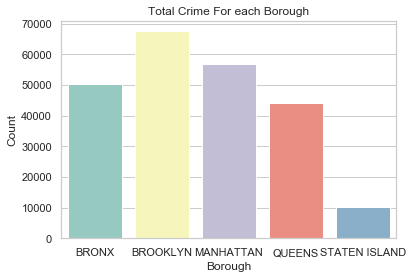

In [48]:
# Plot total crime reports
sns.set(style="whitegrid")
ax = sns.barplot(x='BORO_NM',y='Count', data=crime_count_borough,palette="Set3").set_title('Total Crime For each Borough')
plt.xlabel("Borough")

This seems to be very similar to the rodent count data.

In [49]:
# Use uszipcode to get zipcodes from the longitude and latitude data
from uszipcode import Zipcode
from uszipcode import SearchEngine

search = SearchEngine(simple_zipcode=True) # set simple_zipcode=False to use rich info database

In [50]:
df_crime_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228905 entries, 0 to 228904
Data columns (total 12 columns):
CMPLNT_NUM           228905 non-null int64
CMPLNT_FR_DT         228905 non-null object
OFNS_DESC            228900 non-null object
PD_CD                228757 non-null float64
PD_DESC              228757 non-null object
LAW_CAT_CD           228905 non-null object
BORO_NM              228755 non-null object
ADDR_PCT_CD          228905 non-null int64
LOC_OF_OCCUR_DESC    187313 non-null object
PREM_TYP_DESC        227918 non-null object
Latitude             228891 non-null float64
Longitude            228891 non-null float64
dtypes: float64(3), int64(2), object(7)
memory usage: 21.0+ MB


We will need the latitude and longitude data, so if they are empty then we'll have to drop the row.

In [51]:
# Drop rows that do not have longitude or latitude data
df_crime_drop.dropna(subset=['Latitude','Longitude'], how='all', inplace=True)

In [52]:
# This takes really long so we will save this dataframe if the file doesn't exist
import os

# This takes care of the indexing error
def catch(lat, lon, handle=lambda e : e):
    try:
        return search.by_coordinates(lat=lat, lng=lon, radius=1, returns=1)[0].zipcode
    except IndexError as e:
        return None

#Create a dataframe column with zipcodes that we calculate with latitude and longitude
if not os.path.isfile("Data/crime_cleaned.csv"):
    _zip = zip(df_crime_drop["Latitude"].astype(float),df_crime_drop["Longitude"].astype(float))
    df_crime_drop["ZIPCODE"] = [catch(lat, lon) for lat, lon in _zip]
    df_crime_drop.to_csv("Data/crime_cleaned.csv")
else:    
    df_crime_drop = pd.read_csv("Data/crime_cleaned.csv")

In [53]:
# Drop all the NaN zip codes
df_crime_drop.dropna(subset=['ZIPCODE'], how='all', inplace=True)

In [54]:
df_crime_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 216499 entries, 0 to 228890
Data columns (total 14 columns):
Unnamed: 0           216499 non-null int64
CMPLNT_NUM           216499 non-null int64
CMPLNT_FR_DT         216499 non-null object
OFNS_DESC            216495 non-null object
PD_CD                216363 non-null float64
PD_DESC              216363 non-null object
LAW_CAT_CD           216499 non-null object
BORO_NM              216361 non-null object
ADDR_PCT_CD          216499 non-null int64
LOC_OF_OCCUR_DESC    176934 non-null object
PREM_TYP_DESC        215546 non-null object
Latitude             216499 non-null float64
Longitude            216499 non-null float64
ZIPCODE              216499 non-null float64
dtypes: float64(4), int64(3), object(7)
memory usage: 24.8+ MB


In [55]:
# Get Crime data per zipcode
crime_zipcode_count = df_crime_drop.groupby(['ZIPCODE']).size().reset_index(name='Count')
crime_zipcode_count.describe()

,ZIPCODE,Count
count,201.000000,201.000000
mean,10780.820896,1077.109453
std,629.966267,945.089958
min,7077.000000,6.000000
25%,10199.000000,302.000000
50%,11101.000000,804.000000
75%,11360.000000,1649.000000
max,11697.000000,4675.000000


In [56]:
# Since there are different crimes, I decided to narrow down the crimes to the scary/bad sounding ones
scary_crimes = ["ARSON", "ASSAULT 3 & RELATED OFFENSES", "DANGEROUS DRUGS", "DANGEROUS WEAPONS"
                  "FELONY ASSAULT", "GRAND LARCENY", "GRAND LARCENY OF MOTOR VEHICLE", "KIDNAPPING",
                  "KIDNAPPING & RELATED OFFENSES", "MURDER & NON-NEGL. MANSLAUGHTER", "RAPE" , "ROBBERY"
                  "PROSTITUTION & RELATED OFFENSES", "BURGLARY", "CRIMINAL TRESPASS", "FELONY ASSAULT"]

# Filter out all the crimes that sound scary and bad, we will use this data from now on 
df_bad_crimes = df_crime_drop[df_crime_drop["OFNS_DESC"].isin(scary_crimes) & (df_crime_drop["LAW_CAT_CD"] == "FELONY")]

In [57]:
# Store the crime counts for each zip code, we will prepare it to merge into main dataset
bad_crimes_count = df_bad_crimes.groupby(['ZIPCODE']).size().reset_index(name='Count')
bad_crimes_count.rename(index=str, columns={'Count':'Crime Count'}, inplace=True) # Rename to prepare for merge
bad_crimes_count.ZIPCODE = bad_crimes_count.ZIPCODE.astype(int)

In [58]:
# Merge crime count data into main dataset, we are making an assumption that the crime rates are 
# relatively similar every year, however recent trends show that crime rates have been going down

for date in date_list:
    for borough in borough_list:
        rs_merged_dict[borough+date] = rs_merged_dict[borough+date].merge(bad_crimes_count,how="left", right_on="ZIPCODE", left_on="ZIP CODE")
        rs_merged_dict[borough+date].drop(axis=1, labels=["ZIPCODE"], inplace=True)

In [59]:
# Fill NaNs with zeroes for crime and rodent data
for date in date_list:
    for borough in borough_list:
        rs_merged_dict[borough+date].fillna(value={"Rodent Count":0, "Crime Count":0}, inplace=True)

Correlation for bronx is: 0.634319 with a p value of 0.000501
Correlation for brooklyn is: -0.151978 with a p value of 0.355694
Correlation for manhattan is: 0.263885 with a p value of 0.073083
Correlation for queens is: 0.321417 with a p value of 0.009604
Correlation for statenisland is: -0.039920 with a p value of 0.896978


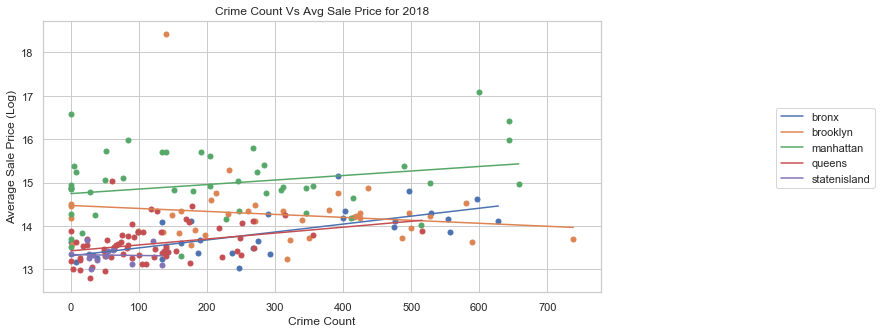

In [60]:
# Visualize correlation between crime reports and sale prices.

fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(111)
plt.title("Crime Count Vs Avg Sale Price for 2018")
for borough in borough_list:
    # Rodent Count
    x = (rs_merged_dict[borough+"2018"].groupby(["ZIP CODE", "SALE PRICE", "Crime Count", "Borough"], as_index=False).mean()).drop_duplicates(['ZIP CODE'])['Crime Count']
    # Average Sale Price
    y = np.log(rs_merged_dict[borough+"2018"].groupby(["ZIP CODE", "SALE PRICE", "Crime Count", "Borough"], as_index=False).mean().groupby(['ZIP CODE','Crime Count', 'Borough'])['SALE PRICE'].mean())
    
    # Correlation and p value
    stat = stats.pearsonr(x,y)
    print("Correlation for %s is: %f with a p value of %f"%(borough, stat[0], stat[1]))
    
    # Regression line
    plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))
    
    ax1.scatter(x, y, label=borough_list, marker='o',s=25)   
    plt.xlabel("Crime Count")
    plt.ylabel("Average Sale Price (Log)")
plt.legend(borough_list, loc='upper right', bbox_to_anchor=(1.5, 0.7))
plt.show()

***

# Construction Data

In [61]:
df_construct = pd.read_csv("Data/construction.csv")
df_construct.columns

Index(['Job Filing Number', 'Filing Reason', 'House No', 'Street Name',
       'Borough', 'LOT', 'Bin', 'Block', 'C B NO', 'Apt/Condo No(s)',
       'Work on Floor', 'Work Type', 'Permittee's License Type',
       'Applicant License #', 'Applicant First Name', 'Applicant Middle Name',
       'Applicant Last Name', 'Applicant Business Name',
       'Applicant Business Address', 'Filing Representative First Name',
       'Filing Representative Middle Initial',
       'Filing Representative Last Name',
       'Filing Representative Business Name', 'Work Permit', 'Approved Date',
       'Issued Date', 'Expired Date', 'Job Description', 'Estimated Job Costs',
       'Owner Business Name', 'Owner Name', 'Owner Street Address',
       'Owner City', 'Owner State', 'Owner Zip Code'],
      dtype='object')

In [62]:
# Remove columns that are not useful
df_construct_less = df_construct.drop(axis=1, labels =[ 'Filing Reason', 'Applicant License #', 'Applicant First Name', 
                                                       'Applicant Middle Name','Applicant Last Name', 'Bin',
                                                       'Applicant Business Name','Applicant Business Address',
                                                       'Filing Representative First Name',
                                                       'Filing Representative Middle Initial',
                                                       'Filing Representative Last Name',
                                                       'Filing Representative Business Name', 
                                                       'Work Permit', 'Owner Business Name', 
                                                       'Owner Name', 'Owner Street Address', 
                                                       'Owner City'])

In [63]:
df_construct_less.head(3)

,Job Filing Number,House No,Street Name,Borough,LOT,Block,C B NO,Apt/Condo No(s),Work on Floor,Work Type,Permittee's License Type,Approved Date,Issued Date,Expired Date,Job Description,Estimated Job Costs,Owner State,Owner Zip Code
0,M00001706-I1,57,HORATIO STREET,MANHATTAN,7502.0,627,102.0,NaN,Ope 1 thru 1,Sidewalk Shed,GC,11/02/2017 12:00:00 AM,11/02/2017 12:00:00 AM,04/16/2018 12:00:00 AM,PROPOSED INSTALLATION OF HEAVY DUTY SIDEWALK S...,6000.0,NY,11419
1,Q00000987-I1,37-16,83 STREET,QUEENS,12.0,1470,403.0,NaN,Sid 001 thru 001,Sidewalk Shed,GC,10/25/2017 12:00:00 AM,11/03/2017 12:00:00 AM,12/12/2017 12:00:00 AM,ALTERATION TYPE 3 - CONSTRUCTION EQUIPMENT - S...,7000.0,NY,11001
2,M00002285-I1,240,EAST 46 STREET,MANHATTAN,7501.0,1319,106.0,NaN,"Ope 011 thru 011,Roo 013 thru 013",Supported Scaffold,GC,11/28/2017 12:00:00 AM,01/16/2018 12:00:00 AM,04/24/2018 12:00:00 AM,INSTALLATION OF PIPE SCAFFOLD AS PER PLANS. NO...,1.0,NY,10007


In [64]:
df_construct_less['Estimated Job Costs'].describe()

count    2.107200e+04
mean     6.736251e+05
std      9.056187e+06
min      0.000000e+00
25%      6.000000e+02
50%      4.000000e+03
75%      8.000000e+03
max      1.250000e+08
Name: Estimated Job Costs, dtype: float64

#### We can see that the mean construction cost is roughly $70,000, however this is due to some extreme outliers. However there is some big variances in the costs.

In [65]:
df_construct_less.rename(index=str, columns={'Owner Zip Code':'Zip Code'}, inplace=True) # Rename zip code column
df_construct_less.head(3)

,Job Filing Number,House No,Street Name,Borough,LOT,Block,C B NO,Apt/Condo No(s),Work on Floor,Work Type,Permittee's License Type,Approved Date,Issued Date,Expired Date,Job Description,Estimated Job Costs,Owner State,Zip Code
0,M00001706-I1,57,HORATIO STREET,MANHATTAN,7502.0,627,102.0,NaN,Ope 1 thru 1,Sidewalk Shed,GC,11/02/2017 12:00:00 AM,11/02/2017 12:00:00 AM,04/16/2018 12:00:00 AM,PROPOSED INSTALLATION OF HEAVY DUTY SIDEWALK S...,6000.0,NY,11419
1,Q00000987-I1,37-16,83 STREET,QUEENS,12.0,1470,403.0,NaN,Sid 001 thru 001,Sidewalk Shed,GC,10/25/2017 12:00:00 AM,11/03/2017 12:00:00 AM,12/12/2017 12:00:00 AM,ALTERATION TYPE 3 - CONSTRUCTION EQUIPMENT - S...,7000.0,NY,11001
2,M00002285-I1,240,EAST 46 STREET,MANHATTAN,7501.0,1319,106.0,NaN,"Ope 011 thru 011,Roo 013 thru 013",Supported Scaffold,GC,11/28/2017 12:00:00 AM,01/16/2018 12:00:00 AM,04/24/2018 12:00:00 AM,INSTALLATION OF PIPE SCAFFOLD AS PER PLANS. NO...,1.0,NY,10007


In [66]:
from geoclient import Geoclient
# Geoclient(ID, API_KEY)
g = Geoclient('cdd9ab01', 'b03c378066a8130549c798f62148c068')

In [67]:
import time # For time.sleep
pd.options.mode.chained_assignment = None  # default='warn'
not_found = [] # Addresses that cannot be found comprised of housenumber, street, borough, and index

# Calculate the zip codes of the construction sites
if not os.path.isfile("Data/construct_clean.csv"):
    for index, row in df_construct_less.iterrows():
        time.sleep(.01)
        try:
            b = g.address(row['House No'],row['Street Name'], row['Borough'])
            df_construct_less.loc[index, 'Zip Code'] = b['zipCode']
        except:
            not_found.append([row['House No'],row['Street Name'], row['Borough'], index])
            print("Address : %s %s on index %s is out of range" %(row['House No'],row['Street Name'],index) )
    df_construct_less.to_csv("Data/construct_clean.csv")
else:
    df_construct_less = pd.read_csv("Data/construct_clean.csv")

# There were a few addresses that could not be found with the API, but because there were only a few I manually added them in.

In [68]:
# Data cleaned
df_construct_less.head(3)

,2,Unnamed: 0,Job Filing Number,House No,Street Name,Borough,LOT,Block,C B NO,Apt/Condo No(s),Work on Floor,Work Type,Permittee's License Type,Approved Date,Issued Date,Expired Date,Job Description,Estimated Job Costs,Owner State,Zip Code
0,0,0,M00001706-I1,57,HORATIO STREET,MANHATTAN,7502.0,627,102.0,NaN,Ope 1 thru 1,Sidewalk Shed,GC,11/2/2017 0:00,11/2/2017 0:00,4/16/2018 0:00,PROPOSED INSTALLATION OF HEAVY DUTY SIDEWALK S...,6000.0,NY,10014
1,1,1,Q00000987-I1,37-16,83 STREET,QUEENS,12.0,1470,403.0,NaN,Sid 001 thru 001,Sidewalk Shed,GC,10/25/2017 0:00,11/3/2017 0:00,12/12/2017 0:00,ALTERATION TYPE 3 - CONSTRUCTION EQUIPMENT - S...,7000.0,NY,11372
2,2,2,M00002285-I1,240,EAST 46 STREET,MANHATTAN,7501.0,1319,106.0,NaN,"Ope 011 thru 011,Roo 013 thru 013",Supported Scaffold,GC,11/28/2017 0:00,1/16/2018 0:00,4/24/2018 0:00,INSTALLATION OF PIPE SCAFFOLD AS PER PLANS. NO...,1.0,NY,10017


In [69]:
df_construct_less['Approved Date'] = pd.to_datetime(df_construct_less['Approved Date'])

In [70]:
df_construct_less['Approved Date'].describe()

count                   21071
unique                   1060
top       2018-06-25 00:00:00
freq                      131
first     2016-06-14 00:00:00
last      2018-11-09 00:00:00
Name: Approved Date, dtype: object

#### We can see that the approval dates go from 2016 to 2018, so we will seperate the years out to do just that

In [71]:
# Seperate the construct dates to their date dataframes, since 2016 only has a half year, we will ignore 2016
# The construction dates from 2017-2018
date_list_short = ["2017","2018"]

# Construction dates for 2017-2018
construct_dates = dict()

for date in date_list_short:
    construct_dates[date] = df_construct_less[df_construct_less['Approved Date'].dt.year == int(date)]

In [72]:
# Sum out the estimated cost of the construction for each zip code and merge into main dataset
data_construct = dict()

for date in date_list_short:
    data_construct[date] = pd.DataFrame(construct_dates[date].groupby(["Zip Code","Borough","Estimated Job Costs"], 
                           as_index=False).mean().groupby(["Borough", "Zip Code"])['Estimated Job Costs'].sum())

# Merge construction data into the main dataset
for date in date_list_short:
    for construct_borough, borough in zip(borough_list_rodent, borough_list):
        new_data = data_construct[date].xs(construct_borough)
        new_data.index = new_data.index.astype(int)
        rs_merged_dict[borough+date] = rs_merged_dict[borough+date].merge(new_data, how="left", right_index=True, left_on="ZIP CODE")

In [73]:
rs_merged_dict["queens2018"].head(3)

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,...,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,Incident Zip,Borough,Rodent Count,Crime Count,Estimated Job Costs
0,4,AIRPORT LA GUARDIA,01 ONE FAMILY DWELLINGS,1,976,29,A5,21-48 81ST STREET,,11370,...,1950,1,A5,730000,2018-07-19 00:00:00,11370.0,QUEENS,35.0,140.0,53760.0
1,4,AIRPORT LA GUARDIA,01 ONE FAMILY DWELLINGS,1,976,68,A5,21-07 80 STREET,,11370,...,1950,1,A5,822500,2018-11-21 00:00:00,11370.0,QUEENS,35.0,140.0,53760.0
2,4,ARVERNE,01 ONE FAMILY DWELLINGS,1,15828,4,A2,310 BEACH 39TH STREET,,11691,...,1940,1,A2,360000,2018-07-06 00:00:00,11691.0,QUEENS,38.0,244.0,1159633.0


Correlation for BRONX is: 0.340674 with a p value of 0.111674
Correlation for BROOKLYN is: 0.188331 with a p value of 0.264304
Correlation for MANHATTAN is: -0.127949 with a p value of 0.431396
Correlation for QUEENS is: 0.357089 with a p value of 0.010102
Correlation for STATEN ISLAND is: 0.386582 with a p value of 0.240218


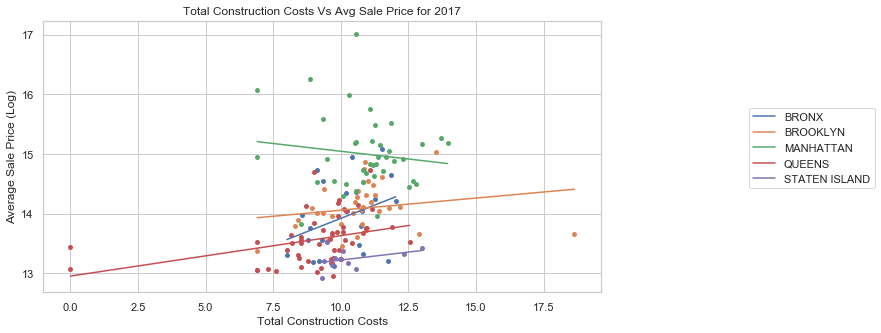

Correlation for BRONX is: 0.243694 with a p value of 0.240440
Correlation for BROOKLYN is: -0.056140 with a p value of 0.737796
Correlation for MANHATTAN is: 0.663293 with a p value of 0.000001
Correlation for QUEENS is: 0.327152 with a p value of 0.009447
Correlation for STATEN ISLAND is: 0.426555 with a p value of 0.166721


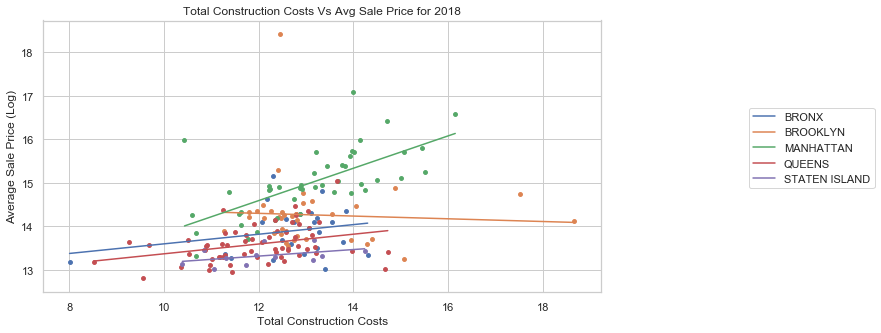

In [74]:
# Visualize correlation between average construction costs for each zip code and their sale prices.

borough_list_construct = borough_list_rodent # Rename to avoid confusion

# Plot the data
for date in date_list_short:
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(111)
    plt.title("Total Construction Costs Vs Avg Sale Price for "+date)
    for construct_borough, borough in zip(borough_list_construct, borough_list):
        data = rs_merged_dict[borough+date]
        
        # Inner join two series on zip codes
        i = (rs_merged_dict[borough+date].groupby(["ZIP CODE", "SALE PRICE", "Borough"], 
                                                    as_index=False).mean().groupby(['ZIP CODE', 'Borough'])['SALE PRICE'].mean())
        j = (rs_merged_dict[borough+date].groupby(["ZIP CODE", 'Estimated Job Costs', 'Borough'],
                                                           as_index=False).mean()).groupby(['ZIP CODE'])['Estimated Job Costs'].mean()
        
        i = pd.DataFrame(i).reset_index(level=[0, 1])
        temp = i.merge(pd.DataFrame(j), left_on='ZIP CODE', right_index=True, how="inner")
        
        # Average Construction Costs
        x = np.log(temp['Estimated Job Costs'])
        # Average Sale Price for each zipcode and borough
        y = np.log(temp['SALE PRICE'])
        
        # Regression line
        plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))
        
        # Correlation and p value
        stat = stats.pearsonr(x,y)
        print("Correlation for %s is: %f with a p value of %f"%(construct_borough, stat[0], stat[1]))
        
        ax1.scatter(x, y, label=construct_borough, marker='o',s=15)   
        plt.xlabel("Total Construction Costs")
        plt.ylabel("Average Sale Price (Log)")
    plt.legend(borough_list_construct, loc='upper right', bbox_to_anchor=(1.5, 0.7))
    plt.show()
    

In [75]:
# Combine all the borough+date dataframes into one dataframe

# Change sale date column to year column
for borough in borough_list:
    for date in date_list:
        rs_merged_dict[borough+date].rename(index=str, columns={'SALE DATE': "SALE YEAR"}, inplace=True)
        rs_merged_dict[borough+date]["SALE YEAR"] = pd.to_datetime(rs_merged_dict[borough+date]["SALE YEAR"])
        rs_merged_dict[borough+date]["SALE YEAR"] = rs_merged_dict[borough+date]["SALE YEAR"].dt.year
        
date_list_nc = ['2010','2011','2012','2013','2014','2015','2016'] # Dates that do not have construction data (Non-constuction)

non_construct_data = []
construct_data = []

# Merge dataframes into two seperate data sets
for borough in borough_list:
    # Non construction data
    for date in date_list_nc:
        non_construct_data.append(rs_merged_dict[borough+date])
    # Construction data
    for date in date_list_short: # 2017 and 2018
        construct_data.append(rs_merged_dict[borough+date])

df_no_construct = pd.concat(non_construct_data)
df_construct = pd.concat(construct_data)


In [76]:
df_no_construct.info()

<class 'pandas.core.frame.DataFrame'>
Index: 352571 entries, 0 to 5682
Data columns (total 23 columns):
BOROUGH                           352571 non-null object
NEIGHBORHOOD                      352571 non-null object
BUILDING CLASS CATEGORY           352571 non-null object
TAX CLASS AT PRESENT              352571 non-null object
BLOCK                             352571 non-null object
LOT                               352571 non-null object
BUILDING CLASS AT PRESENT         352571 non-null object
ADDRESS                           352571 non-null object
APARTMENT NUMBER                  352571 non-null object
ZIP CODE                          352571 non-null int32
RESIDENTIAL UNITS                 352571 non-null object
COMMERCIAL UNITS                  352571 non-null object
LAND SQUARE FEET                  352571 non-null object
GROSS SQUARE FEET                 352571 non-null object
YEAR BUILT                        352571 non-null object
TAX CLASS AT TIME OF SALE         352571 n

In [77]:
df_no_construct.columns

Index(['BOROUGH', 'NEIGHBORHOOD', 'BUILDING CLASS CATEGORY',
       'TAX CLASS AT PRESENT', 'BLOCK', 'LOT', 'BUILDING CLASS AT PRESENT',
       'ADDRESS', 'APARTMENT NUMBER', 'ZIP CODE', 'RESIDENTIAL UNITS',
       'COMMERCIAL UNITS', 'LAND SQUARE FEET', 'GROSS SQUARE FEET',
       'YEAR BUILT', 'TAX CLASS AT TIME OF SALE',
       'BUILDING CLASS AT TIME OF SALE', 'SALE PRICE', 'SALE YEAR',
       'Incident Zip', 'Borough', 'Rodent Count', 'Crime Count'],
      dtype='object')

In [78]:
# Drop columns that are either duplicates or have no quantitative meanings such as address, block, and lots
df_no_construct.drop(columns=['Incident Zip','TAX CLASS AT PRESENT', 'BOROUGH', 'ADDRESS', 'BUILDING CLASS AT PRESENT', 'BLOCK', 'LOT'], inplace=True)
df_construct.drop(columns=['Incident Zip', 'TAX CLASS AT PRESENT', 'BOROUGH', 'ADDRESS', 'BUILDING CLASS AT PRESENT', 'BLOCK', 'LOT'], inplace=True)

In [79]:
df_construct.info()

<class 'pandas.core.frame.DataFrame'>
Index: 109909 entries, 0 to 5380
Data columns (total 17 columns):
NEIGHBORHOOD                      109909 non-null object
BUILDING CLASS CATEGORY           109909 non-null object
APARTMENT NUMBER                  109909 non-null object
ZIP CODE                          109909 non-null int32
RESIDENTIAL UNITS                 109909 non-null object
COMMERCIAL UNITS                  109909 non-null object
LAND SQUARE FEET                  109909 non-null object
GROSS SQUARE FEET                 109909 non-null object
YEAR BUILT                        109909 non-null object
TAX CLASS AT TIME OF SALE         109909 non-null object
BUILDING CLASS AT TIME OF SALE    109909 non-null object
SALE PRICE                        109909 non-null object
SALE YEAR                         109909 non-null int64
Borough                           109909 non-null object
Rodent Count                      109909 non-null float64
Crime Count                       109909 n

#### There are some NaN values for Estimated Job Costs (Money it costs for construction). The easiest way to solve it would be to drop the rows with NaN. Another way would be to set the values of those to 0, but that may be a bad idea. Dropping the rows, in my opinion would have the least unintended consquences.

In [80]:
df_construct.dropna(how='any', inplace=True)

In [81]:
df_construct.info()

<class 'pandas.core.frame.DataFrame'>
Index: 106060 entries, 0 to 5380
Data columns (total 17 columns):
NEIGHBORHOOD                      106060 non-null object
BUILDING CLASS CATEGORY           106060 non-null object
APARTMENT NUMBER                  106060 non-null object
ZIP CODE                          106060 non-null int32
RESIDENTIAL UNITS                 106060 non-null object
COMMERCIAL UNITS                  106060 non-null object
LAND SQUARE FEET                  106060 non-null object
GROSS SQUARE FEET                 106060 non-null object
YEAR BUILT                        106060 non-null object
TAX CLASS AT TIME OF SALE         106060 non-null object
BUILDING CLASS AT TIME OF SALE    106060 non-null object
SALE PRICE                        106060 non-null object
SALE YEAR                         106060 non-null int64
Borough                           106060 non-null object
Rodent Count                      106060 non-null float64
Crime Count                       106060 n

In [82]:
# Change entries to integer
cols = ['RESIDENTIAL UNITS', 'COMMERCIAL UNITS','LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT', 'TAX CLASS AT TIME OF SALE']

df_construct[cols] = df_construct[cols].astype(int)
df_no_construct[cols] = df_no_construct[cols].astype(int)

df_construct['SALE PRICE'] = df_construct['SALE PRICE'].astype('int64')
df_no_construct['SALE PRICE'] = df_no_construct['SALE PRICE'].astype('int64')

In [83]:
# Convert APARTMENT NUMBER Column to Is Apartment Column, at the moment the numbers themselves are meaningless

# Convert entry to 0 or 1 depending on 
df_construct['APARTMENT NUMBER'] = df_construct['APARTMENT NUMBER'].map(lambda a: 1 if str(a).isdigit() else 0)
df_no_construct['APARTMENT NUMBER'] = df_no_construct['APARTMENT NUMBER'].map(lambda a: 1 if str(a).isdigit() else 0)

df_construct.rename(index=str, columns={'APARTMENT NUMBER': "Is Apartment"}, inplace=True)
df_no_construct.rename(index=str, columns={'APARTMENT NUMBER': "Is Apartment"}, inplace=True)

In [84]:
# Normalize SALE YEAR data 
df_construct['SALE YEAR'] = df_construct['SALE YEAR'] - 2010
df_no_construct['SALE YEAR'] = df_no_construct['SALE YEAR'] - 2010

In [85]:
# One hot encoding for categorial features
categorical_cols = ['NEIGHBORHOOD','BUILDING CLASS CATEGORY', 'BUILDING CLASS AT TIME OF SALE','Borough']
encoded_cat_df_construct = pd.get_dummies(df_construct[categorical_cols], prefix=['neighborhood','building class','Building Class','Borough'])
encoded_cat_df_no_construct = pd.get_dummies(df_no_construct[categorical_cols], prefix=['neighborhood','building class','Building Class','Borough'])

In [86]:
# Drop categorical columns, we will later replace them with one hot encoded ones
df_construct.drop(columns=categorical_cols, inplace=True)
df_no_construct.drop(columns=categorical_cols, inplace=True)

##### Before we add the one hot encoded data, we can do some feature selection by plotting the correlation of each feature

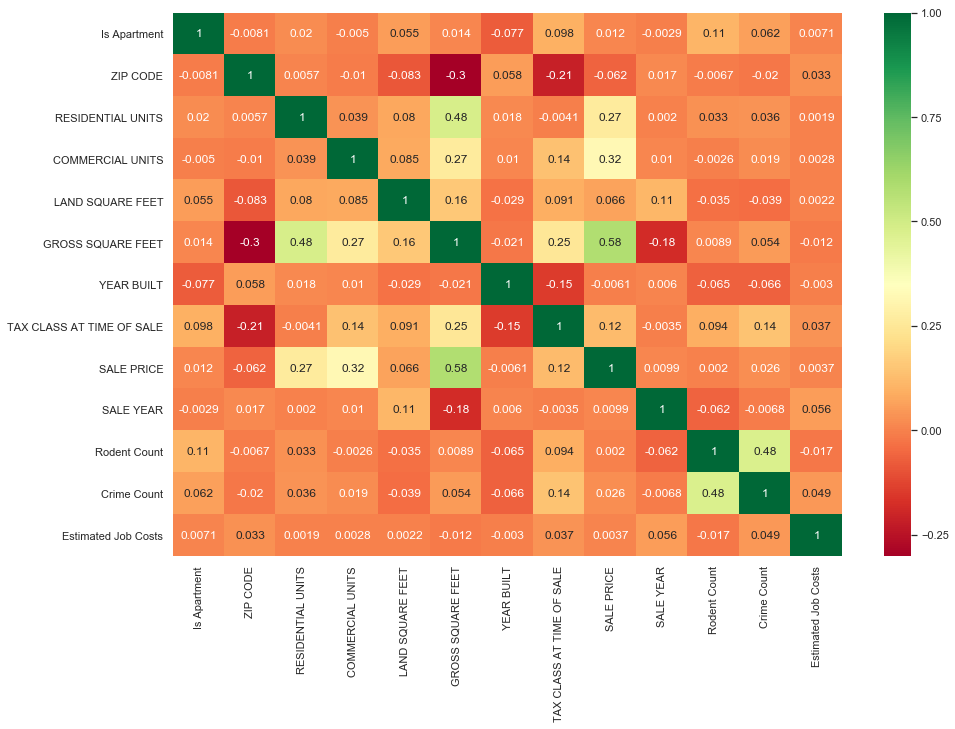

In [87]:
# Plot correlation heatmap
plt.figure(figsize=(15,10))

# Get correlations of each features in dataset
correlation = df_construct.corr()
# Plot heat map
_ = sns.heatmap(correlation, annot=True,cmap="RdYlGn")

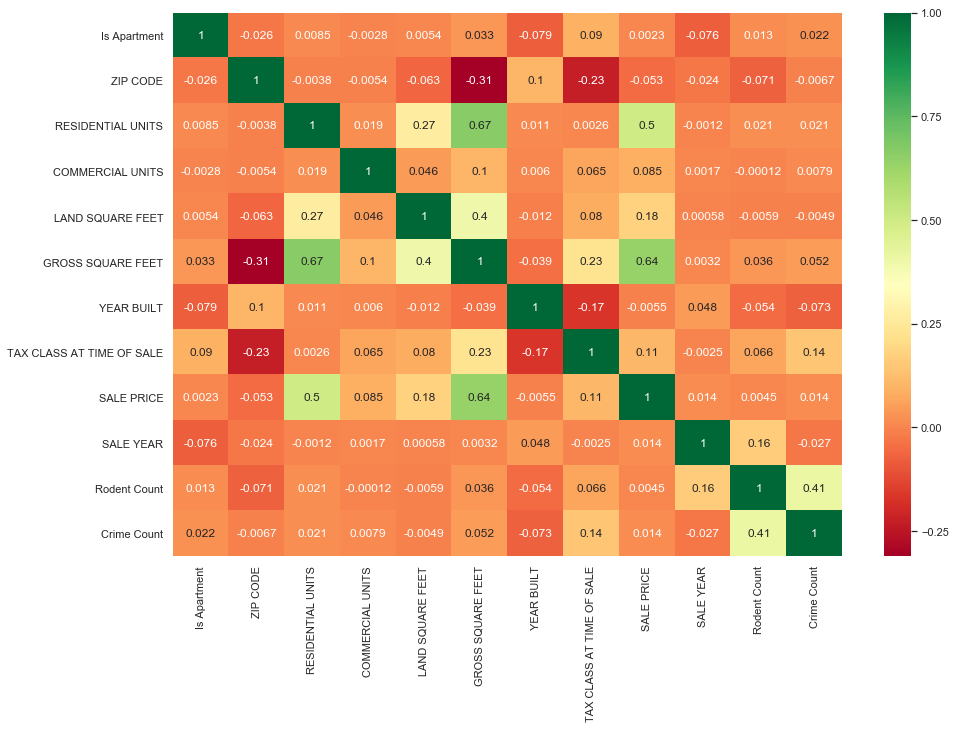

In [88]:
# Plot correlation heatmap
plt.figure(figsize=(15,10))

# Get correlations of each features in dataset
correlation = df_no_construct.corr()
# Plot heat map
_ = sns.heatmap(correlation, annot=True,cmap="RdYlGn")

#### From the two heat plots, we can see that sale price has correlation with the number of Residential Units, and the Gross square feet, besides those two, it has low correlation with the other ones. Unfortunately, Estimated Construction costs seem to have a low correlation with everything. One possible explanation is that the feature tries to generalize things to a zip code level, which leads to over generalization on different variances of sale prices. 

In [89]:
# Add the one hot encoded ones
combine_constructed = pd.concat([df_construct,encoded_cat_df_construct],axis=1)
combine_no_constructed = pd.concat([df_no_construct, encoded_cat_df_no_construct], axis=1)

In [90]:
# Construct the features and target, one for ones that contain the construction data, one that does not
features_construct = combine_constructed.drop(columns='SALE PRICE')
features_no_construct = combine_no_constructed.drop(columns='SALE PRICE')
target_construct = combine_constructed['SALE PRICE']
target_no_construct = combine_no_constructed['SALE PRICE']

In [91]:
# Log transform the sales and costs because the data is a bit skewed and exponential
features_construct['Estimated Job Costs'] = np.log(features_construct['Estimated Job Costs'])
target_construct = np.log(target_construct)
target_no_construct = np.log(target_no_construct)

In [92]:
features_no_construct.info()

<class 'pandas.core.frame.DataFrame'>
Index: 352571 entries, 0 to 5682
Columns: 521 entries, Is Apartment to Borough_STATEN ISLAND
dtypes: float64(2), int32(7), int64(2), uint8(510)
memory usage: 194.3+ MB


#### We will begin with a lasso regression because there are so many columns, Lasso regression will help 

***

# Lasso Regression

In [93]:
# Import Lasso
from sklearn.linear_model import LassoCV
from sklearn import model_selection
import pickle #Serialize models
import warnings

warnings.filterwarnings("ignore") # Convergence Warning for lasso

# Instantiate a lasso regressor: lasso
lasso = LassoCV(alphas=[1, 0.1, 0.001, 0.0005], normalize=True)

X = features_construct
y = target_construct

# Split into test and training set
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.33, random_state=42)

# Fit the regressor to the data
lasso.fit(X_train, y_train)

# Compute and print the coefficients
lasso_coef = lasso.coef_
# print(lasso_coef)

In [94]:
lasso.score(X_test, y_test)

0.23057553785210916

In [95]:
print("%i features were kept %i features were dropped"%(sum(lasso.coef_ != 0) , sum(lasso.coef_ == 0)))

7 features were kept 475 features were dropped


In [96]:
# Instantiate a lasso regressor: lasso
lasso_nc = LassoCV(alphas=[1, 0.1, 0.001, 0.0005], normalize=True)

X = features_no_construct
y = target_no_construct

# Split into test and training set
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.33, random_state=42)

# Fit the regressor to the data
lasso_nc.fit(X_train, y_train)

# Compute and print the coefficients
lasso_coef = lasso_nc.coef_
# print(lasso_coef)

In [97]:
lasso_nc.score(X_test, y_test)

0.11714758713349205

In [98]:
print("%i features were kept %i features were dropped"%(sum(lasso.coef_ != 0) , sum(lasso.coef_ == 0)))

7 features were kept 475 features were dropped


#### The scores are pretty bad, but it does seem that the construction data feature does help the data a bit.

                                                 Specs        Score
281  building class_08  RENTALS - ELEVATOR APARTMEN...  5343.386198
280  building class_07  RENTALS - WALKUP APARTMENTS...  3537.876659
283  building class_10  COOPS - ELEVATOR APARTMENTS...  3437.529304
351                                  Building Class_D4  3437.529304
338                                  Building Class_C1  3170.123802
348                                  Building Class_D1  2928.775376
5                                    GROSS SQUARE FEET  2676.275002
192             neighborhood_PARKCHESTER                1804.939561
287  building class_13  CONDOS - ELEVATOR APARTMENT...  1620.707412
457                                  Building Class_R4  1620.707412
6                                           YEAR BUILT  1470.871930
344                                  Building Class_C7  1281.075909
354                                  Building Class_D7  1194.900292
7                            TAX CLASS AT TIME O

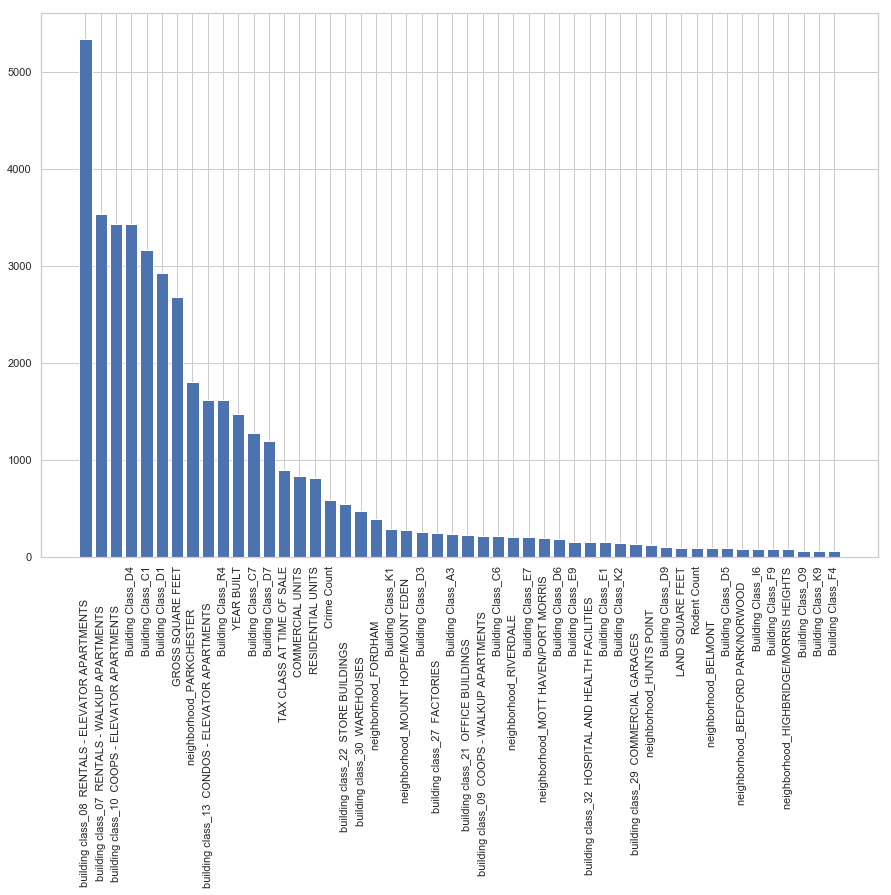

In [99]:
# Feature selection to show the best features for the model
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

# Sample the first 25,000 because of memory issues
X_construct = features_no_construct.iloc[:25000].astype('float') #independent columns
y_construct = target_no_construct.iloc[:25000].astype('float') #target colum

# Select 25 best features for construction data
bestfeatures = SelectKBest(score_func=f_regression, k=50)

fit = bestfeatures.fit(X_construct,y_construct)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_construct.columns)

#concat two dataframes for better visualization 
feature_scores = pd.concat([dfcolumns,dfscores],axis=1)
feature_scores.columns = ['Specs','Score']  #naming the dataframe columns
feature_scores_construct = feature_scores.nlargest(50,'Score')
print(feature_scores_construct)  #print 50 best features

# Plot the data
plt.figure(figsize=(15,10))
plt.bar(feature_scores_construct.Specs, feature_scores_construct.Score)
plt.xticks(rotation=90)
plt.show()

                                                 Specs        Score
339                                  Building Class_D4  4156.017976
274  building class_10 COOPS - ELEVATOR APARTMENTS ...  4148.815709
477                                      Borough_BRONX  3041.344824
478                                   Borough_BROOKLYN  3041.344824
1                                             ZIP CODE  3006.828556
2                                    RESIDENTIAL UNITS  2094.069173
5                                    GROSS SQUARE FEET  2083.807405
3                                     COMMERCIAL UNITS  1604.677284
271  building class_07 RENTALS - WALKUP APARTMENTS ...  1444.702484
190                           neighborhood_PARKCHESTER  1428.061980
325                                  Building Class_C1  1326.395518
272  building class_08 RENTALS - ELEVATOR APARTMENT...  1253.037941
9                                         Rodent Count   788.469895
336                                  Building Cl

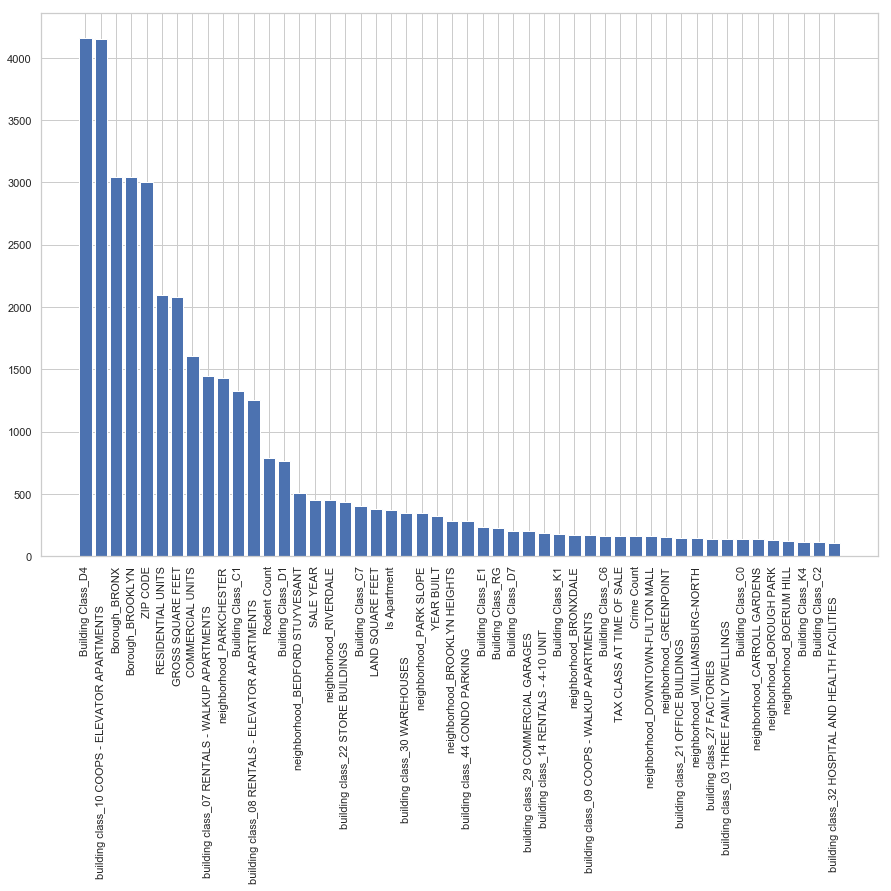

In [100]:
# Do the same for the construction data

# Sample the first 25,000 because of memory issues
X_construct = features_construct.iloc[:25000] #independent columns
y_construct = target_construct.iloc[:25000] #target colum

# Select 25 best features for construction data
bestfeatures = SelectKBest(score_func=f_regression, k=50)

fit = bestfeatures.fit(X_construct,y_construct)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_construct.columns)

# concat two dataframes for better visualization 
feature_scores = pd.concat([dfcolumns,dfscores],axis=1)
feature_scores.columns = ['Specs','Score']  #naming the dataframe columns
feature_scores_no_construct = feature_scores.nlargest(50,'Score')
print(feature_scores_no_construct)  #print 50 best features

# Plot the data
plt.figure(figsize=(15,10))
plt.bar(feature_scores_no_construct.Specs, feature_scores_no_construct.Score)
plt.xticks(rotation=90)
plt.show()

#### Let us first build a random forest model with regular bootstrapping resampling

***
# Random Forest



In [101]:
# Random Forest Regression
from sklearn.ensemble import RandomForestRegressor

try:
    rand_forest = pickle.load(open(filename, 'data/randforest_construct.sav'))
except:
    X = features_construct
    y = target_construct

    # Split into test and training set
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.33, random_state=42)

    rand_forest = RandomForestRegressor(max_depth = 50, random_state = 42, n_estimators = 100)

    # Fit the regressor to the data
    rand_forest.fit(X_train, y_train)
    
    # Pickle serialization of random forest model
    pickled_randfnc = 'data/randforest_construct.sav' # Pickled random forest no construct
    pickle.dump(rand_forest, open(pickled_randfnc, 'wb'))

In [102]:
rand_forest.score(X_test, y_test)

0.7315765285655214

In [103]:
#plt.scatter(rand_forest.predict(X_test), y_test)
residuals = y_test - rand_forest.predict(X_test)

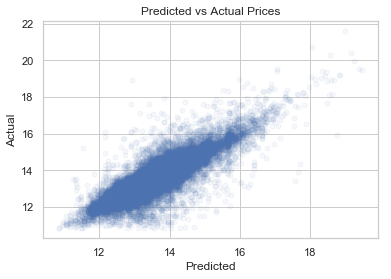

In [104]:
# Predicted vs actual
ax = plt.scatter(rand_forest.predict(X_test), y_test, alpha=0.05 ,s=25)
plt.title("Predicted vs Actual Prices")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

Text(0.5,0,'Residuals')

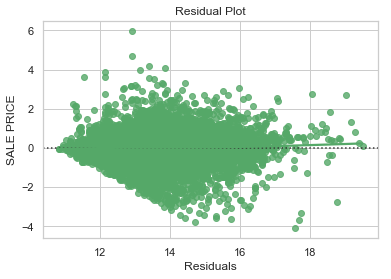

In [105]:
# plt.scatter(rand_forest.predict(X_test), y_test)
sns.residplot(rand_forest.predict(X_test), y_test, lowess=True, color="g")
plt.title("Residual Plot")
plt.xlabel("Sale Price")
plt.xlabel("Residuals")

In [106]:
try:
    rand_forest = pickle.load(open(filename, 'data/randforest_no_construct.sav'))
except:
    X = features_no_construct
    y = target_no_construct

    # Split into test and training set
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.33, random_state=42)

    rand_forest = RandomForestRegressor(max_depth = 50, random_state = 42, n_estimators = 100)

    # Fit the regressor to the data
    rand_forest.fit(X_train, y_train)
    
    # Pickle serialization of random forest model
    pickled_randfnc = 'data/randforest_no_construct.sav' # Pickled random forest no construct
    pickle.dump(rand_forest, open(pickled_randfnc, 'wb'))

In [107]:
rand_forest.score(X_test, y_test)

0.7190868363291139

In [108]:
residuals = y_test - rand_forest.predict(X_test)

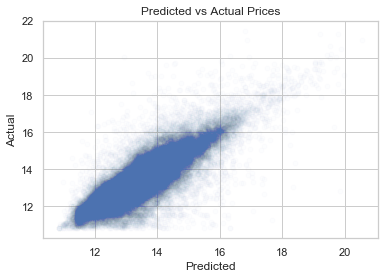

In [109]:
# Predicted vs actual
ax = plt.scatter(rand_forest.predict(X_test), y_test, alpha=0.01 ,s=25)
plt.title("Predicted vs Actual Prices")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

Text(0.5,0,'Residuals')

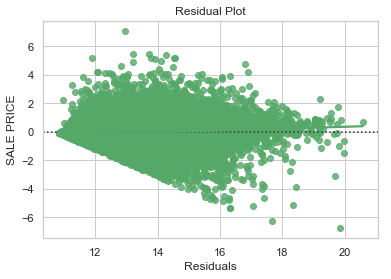

In [110]:
# plt.scatter(rand_forest.predict(X_test), y_test)
sns.residplot(rand_forest.predict(X_test), y_test, lowess=True, color="g")
plt.title("Residual Plot")
plt.xlabel("Sale Price")
plt.xlabel("Residuals")

#### The scores seem pretty okay, but I want to see if it is possible to get something better. I will implement a jackknife resampling method of random forest. 

***

# JackKnife method

In [111]:
from astropy.stats import jackknife_resampling
from astropy.stats import jackknife_stats
import random

In [112]:
# 50 features, and 100 decision trees

features = np.arange(0,482,1)
resamples = jackknife_resampling(features)
resamples_jackknife = [] 

# Choose only 100
resamples = resamples[:100]
for i, r in enumerate(resamples):
    random.shuffle(r)
    resamples_jackknife.append(resamples[i][:50]) # Choose only 50 features

In [113]:
from IPython.display import HTML
import random

def hide_toggle(for_next=False):
    this_cell = """$('div.cell.code_cell.rendered.selected')"""
    next_cell = this_cell + '.next()'

    toggle_text = 'Toggle show/hide'  # text shown on toggle link
    target_cell = this_cell  # target cell to control with toggle
    js_hide_current = ''  # bit of JS to permanently hide code in current cell (only when toggling next cell)

    if for_next:
        target_cell = next_cell
        toggle_text += ' next cell'
        js_hide_current = this_cell + '.find("div.input").hide();'

    js_f_name = 'code_toggle_{}'.format(str(random.randint(1,2**64)))

    html = """
        <script>
            function {f_name}() {{
                {cell_selector}.find('div.input').toggle();
            }}
            {js_hide_current}
        </script>

        <a href="javascript:{f_name}()">{toggle_text}</a>
    """.format(
        f_name=js_f_name,
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
        toggle_text=toggle_text
    )

    return HTML(html)

hide_toggle()

In [114]:
# The columns that we got from SelectKBest(k=50), had to define it manually because the names in the specs changed for some reason
construct_columns = ['building class_08 RENTALS - ELEVATOR APARTMENTS           ',
                    'building class_07 RENTALS - WALKUP APARTMENTS             ',
                    'building class_10 COOPS - ELEVATOR APARTMENTS             ',
                    'Building Class_D4',
                    'Building Class_C1',
                    'Building Class_D1',
                    'GROSS SQUARE FEET',
                    'neighborhood_PARKCHESTER',
                    'Building Class_R4',
                    'YEAR BUILT',
                    'Building Class_C7',
                    'Building Class_D7',
                    'TAX CLASS AT TIME OF SALE',
                    'COMMERCIAL UNITS',
                    'RESIDENTIAL UNITS',
                    'Crime Count',
                    'building class_22 STORE BUILDINGS                         ',
                    'building class_30 WAREHOUSES                              ',
                    'neighborhood_FORDHAM',
                    'Building Class_K1',
                    'neighborhood_MOUNT HOPE/MOUNT EDEN',
                    'Building Class_D3',
                    'building class_27 FACTORIES                               ',
                    'Building Class_A3',
                    'building class_21 OFFICE BUILDINGS                        ',
                    'building class_09 COOPS - WALKUP APARTMENTS               ',
                    'Building Class_C6',
                    'neighborhood_RIVERDALE',
                    'Building Class_E7',
                    'neighborhood_MOTT HAVEN/PORT MORRIS',
                    'Building Class_D6',
                    'Building Class_E9',
                    'building class_32 HOSPITAL AND HEALTH FACILITIES          ',
                    'Building Class_E1',
                    'Building Class_K2',
                    'building class_29 COMMERCIAL GARAGES                      ',
                    'neighborhood_HUNTS POINT',
                    'Building Class_D9',
                    'LAND SQUARE FEET',
                    'Rodent Count',
                    'neighborhood_BELMONT',
                    'Building Class_D5',
                    'neighborhood_BEDFORD PARK/NORWOOD',
                    'Building Class_I6',
                    'Building Class_F9',
                    'neighborhood_HIGHBRIDGE/MORRIS HEIGHTS',
                    'Building Class_O9',
                    'Building Class_K9',
                    'Building Class_F4']



hide_toggle()

In [115]:
from sklearn.tree import DecisionTreeRegressor

# feature_scores_construct
# feature_scores_no_construct
decision_tree_predictions = []
decision_tree_scores = []

# Features and target
X = features_construct
y = target_construct

# There are 482 features for the dataset
columns_construct = np.array(X.columns)

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.33, random_state=42)

for resample in resamples_jackknife:
    d_tree = DecisionTreeRegressor()
    
    # Recalculate X train and X test based on the columns provided
    df = [X_train[columns_construct[int(col)]] for col in resample]
    X_train_temp = pd.concat(df, axis=1)
    
    df = [X_test[columns_construct[int(col)]] for col in resample]
    X_test_temp = pd.concat(df, axis=1)
        
    d_tree.fit(X_train_temp, y_train)
    
    decision_tree_predictions.append(d_tree.predict(X_test_temp))
    decision_tree_scores.append(d_tree.score(X_test_temp, y_test))
    
predictions = np.mean(decision_tree_predictions, axis=0)

In [116]:
# Combine predictions with data obtained from SelectKBest
d_tree = DecisionTreeRegressor()

X = X_train[construct_columns]
y = y_train

d_tree.fit(X, y)

select_k_pred = d_tree.predict(X_test[construct_columns])

In [117]:
# Get average of the two predictions
predictions = (select_k_pred+predictions)/2

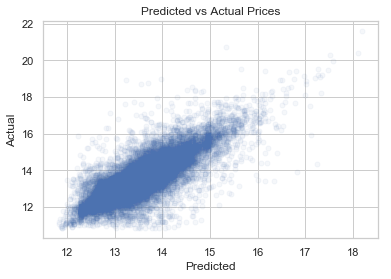

In [118]:
# Predicted vs actual
ax = plt.scatter(predictions, y_test, alpha=0.05 ,s=25)
plt.title("Predicted vs Actual Prices")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

Text(0.5,0,'Residuals')

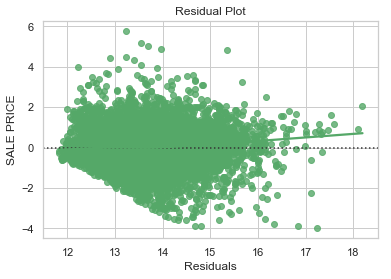

In [119]:
# plt.scatter(rand_forest.predict(X_test), y_test)
sns.residplot(predictions, y_test, lowess=True, color="g")
plt.title("Residual Plot")
plt.xlabel("Sale Price")
plt.xlabel("Residuals")

In [120]:
from sklearn.metrics import r2_score

print(r2_score(y_test,predictions))

0.6150840990005164


#### The score is a bit worse than just using random forest with regular bootstrap method. Overall, from the plots, we can see that generally, the prediction is somewhere near the actual cost. However, there are quite a number of outliers that the model does not seem to account for, this may be due to some features that we do not have access to or it could be something entirely something else.

In [121]:
# Archived code

######################
####Old Data Code#####
######################

# # Removes extra whitespace from a string
# def remove_extra_white_space( str ):
#     words = str.split()
#     return " ".join(words)

# nyc_addresses = pd.read_csv("data/nyc.csv")
# nyc_property_info = pd.read_csv("data/output.csv")

# nyc_addresses.info()
# nyc_property_info.info()

# # Combine building number and street and clean street column
# nyc_addresses['STREET'] = nyc_addresses['STREET'].apply(remove_extra_white_space)
# nyc_addresses['ADDRESS'] = nyc_addresses['NUMBER'] + " " + nyc_addresses['STREET']

# # Make both indexes lower case so they have the same format
# nyc_addresses['ADDRESS'] = nyc_addresses['ADDRESS'].str.lower()
# nyc_property_info['building_addr'] = nyc_property_info['building_addr'].str.lower()

# # Remove unnessary columns
# nyc_addresses = nyc_addresses.drop(columns=['NUMBER', 'STREET', 'CITY', 'DISTRICT', 'REGION', 'ID', 'HASH'], axis=1)

######################
##Old Data Code End###
######################

# # Plot normal distribution of graph
# dfs = []

# for borough in borough_list:
#     for date in date_list:
#         dfs.append(rollingsales_dict[borough+date])

# df_concat = pd.concat(dfs)

# from scipy.stats import norm
# plt.figure(figsize=(10,5))

# x = pd.DataFrame(df_concat['SALE PRICE'])
# x = x.astype(float)
# x = np.sort(x)
# sns.distplot(a=x[:500], fit=norm)

# # data is not really normally distributed

######################

# # Read date into dictionary (Takes a while to load in) Also cleans the data
# for date in date_list:
#     for borough in borough_list:
        
#         # Read in data
#         rollingsales_dict[borough+date] = pd.read_excel("data/rollingsales/"+date+"/"+date+"_"+borough+".xls")
#         # First few rows are dataframe information not actual data so they are dropped
#         if date == '2010':
#             rollingsales_dict[borough+date].columns = columns
#             rollingsales_dict[borough+date].drop([0,1,2], inplace=True)
#         else:
#             rollingsales_dict[borough+date].columns = columns
#             rollingsales_dict[borough+date].drop([0,1,2,3], inplace=True)
            
#         # Convert all columns from objects to string so it's easier to merge them later on
#         rollingsales_dict[borough+date][columns] = rollingsales_dict[borough+date][columns].astype(str)
        
#         # Drop redundant or useless columns to make things easier to look at
#         rollingsales_dict[borough+date].drop(['EASE-MENT','TOTAL UNITS'], axis=1, inplace=True)
         
#         # Change the name of the sales column into the year (date)
#         rollingsales_dict[borough+date].rename(columns={'SALE PRICE':date}, inplace=True)
        
#         # Drop row duplicates, keep only the last seen instance
#         rollingsales_dict[borough+date].drop_duplicates(inplace=True, subset=["ADDRESS", "APARTMENT NUMBER"], keep="last")

######################

# # Drop columns that ends with _y from a dataframe
# def drop_y(df):
#     # list comprehension of the cols that end with '_y'
#     to_drop = [x for x in df if x.endswith('_y')]
#     df.drop(to_drop, axis=1, inplace=True)

# # example below
# #result = pd.merge(rollingsales_dict['bronx2010'],rollingsales_dict['bronx2011'],on='ADDRESS',suffixes=('_', '_y'), how='outer')
# #drop_y(result)

# # Store the concatenation of the rolling sales data for each borough
# borough_dict = dict()

######################

# # Compact the dataframes from borough+date to just borough
# for borough in borough_list:
#     borough_dict[borough] = pd.concat([rollingsales_dict[borough+date] for date in date_list], sort=True)
#     #print("Length before concat of ", borough, " is ", len(borough_dict[borough]))
#     borough_dict[borough].drop_duplicates(inplace=True, subset=["ADDRESS", "APARTMENT NUMBER"])
#     #print("Length after concat of ", borough, " is ", len(borough_dict[borough]))

# for date in date_list:
#     print(date , " " , len(rollingsales_dict["queens"+date]))
#     borough_dict["queens"] = borough_dict["queens"].merge(rollingsales_dict["queens"+date],
#                                                         on=["ADDRESS", "APARTMENT NUMBER"], suffixes=('', '_y'),
#                                                         how='left')
#     drop_y(borough_dict["queens"])

######################

# # Check if there any missing counts
# for borough in borough_list:
#     for date in date_list:
#         print(rs_merged_dict[borough+date].describe())

# # Geopy to get zipcode data from lat and lon
# from geopy.geocoders import GoogleV3
# geolocator = GoogleV3()
# address, (latitude, longitude) = geolocator.reverse("40.752067, -73.977578")
# print(address, latitude, longitude)

######################

# The code below times out due to API limitations 
# # Geopy to get Zipcode of construction location
# from geopy.geocoders import Nominatim

# geolocator = Nominatim(user_agent="nyc-housing")

# # Get Lon and Lat date so we can find zip code
# try:
#     house_address_zip = zip(df_construct_less["House No"],df_construct_less["Street Name"])
#     geocode = [geolocator.geocode(house_n + " " + street_n) for house_n, street_n in house_address_zip]
# except GeocoderTimedOut as e:
#     print("Error: geocode failed on input with message %s"%(e.message))

######################

# # Because of this assumption we will have to figure out the zip codes 
# # of those that are over $50,000 and the owners who live in different states
# from geopy.geocoders import Nominatim

# # Initialize nominatim object that helps convert address to zip code
# geolocator = Nominatim(user_agent="nyc-housing")

# #There seems to be some sort of time out if we do too many at once, so we will make program sleep
# import time

######################


# # Returns zip code if 
# def get_zip_code(row):
#     if row['Estimated Job Costs'] >= 50000:
#         time.sleep(0.1)
#         geocode = geolocator.geocode(row["House No"] + " " + row["Street Name"])
#         # If geocode is a None type object, we should delete the row
#         if geocode is None:
#             val = None # Set the zipcode to None so we can delete the row later
#         else:
#             val = catch(geocode.latitude, geocode.longitude) # Returns zipcode
#             print(str(row) + " " + val)
#     else:
#         val = row['Zip Code']   
#     return val

# df_construct_less['Zip Code'] = df_construct_less.apply(get_zip_code, axis=1) 

######################

# # Because of this assumption we will have to figure out the zip codes 
# # of those that are over $50,000 and the owners who live in different states
# import time
# from geopy.geocoders import Nominatim
# from geopy.extra.rate_limiter import RateLimiter
# from geopy.exc import GeocoderTimedOut

# # Initialize nominatim object that helps convert address to zip code
# geolocator = Nominatim(user_agent="nyc-housing-new")

# def geocode_locator(row, index):
#     time.sleep(1)
#     try:
#         return geolocator.geocode(row["House No"] + " " + row["Street Name"] + ", " + row["Borough"] + ", NYC")
#     except GeocoderTimedOut:
#         print("Error on index: %s" %(index))      
#         return geocode_locator(row, index)
    
# for index, row in df_construct_less.iterrows(): 
#     geocode = geocode_locator(row, index)
#     # If geocode is a None type object, we should delete the row
#     if geocode is None:
#         #print("None Type detected at %s" % (index)) # Debug
#         val = None # Set the zipcode to None so we can delete the row later
#     else:
#         # print(geocode.address) # Debug
#         val = catch(geocode.latitude, geocode.longitude) # Returns zipcode
#     #print("Zipcode: %s is now: %s for index: %s" %(row['Zip Code'], val, index))
#     row['Zip Code'] = val # Change the row value of zipcode to the calculated zip code

######################

# # Lasso Regression
# from sklearn.linear_model import Lasso # Import Lasso
# from sklearn.linear_model import LinearRegression


# # Instantiate a lasso regressor: lasso
# lasso = Lasso(alpha=0.4, normalize=True)

# lasso.fit(X_scaled,y_log)

# FI_lasso = pd.DataFrame({"Feature Importance":lasso.coef_}, index=data_pipeline.columns)
# FI_lasso.sort_values("Feature Importance",ascending=False)

#####################

# # The columns that we got from SelectKBest(k=50), had to define it manually because the names in the specs changed for some reason
# no_construct_columns = [ 'Building Class_D4',
#                          'building class_10  COOPS - ELEVATOR APARTMENTS             ',
#                          'Borough_BRONX',
#                          'Borough_BROOKLYN',
#                          'ZIP CODE',
#                          'RESIDENTIAL UNITS',
#                          'GROSS SQUARE FEET',
#                          'COMMERCIAL UNITS',
#                          'building class_07  RENTALS - WALKUP APARTMENTS             ',
#                          'neighborhood_PARKCHESTER              ',
#                          'Building Class_C1',
#                          'building class_08  RENTALS - ELEVATOR APARTMENTS           ',
#                          'Rodent Count',
#                          'Building Class_D1',
#                          'neighborhood_BEDFORD STUYVESANT       ',
#                          'SALE YEAR',
#                          'neighborhood_RIVERDALE                ',
#                          'building class_22  STORE BUILDINGS                         ',
#                          'Building Class_C7',
#                          'LAND SQUARE FEET',
#                          'Is Apartment',
#                          'building class_30  WAREHOUSES                              ',
#                          'neighborhood_PARK SLOPE               ',
#                          'YEAR BUILT',
#                          'neighborhood_BROOKLYN HEIGHTS         ',
#                          'building class_44  CONDO PARKING                           ',
#                          'Building Class_E1',
#                          'Building Class_RG',
#                          'Building Class_D7',
#                          'building class_29  COMMERCIAL GARAGES                      ',
#                          'building class_14  RENTALS - 4-10 UNIT                     ',
#                          'Building Class_K1',
#                          'neighborhood_BRONXDALE                ',
#                          'building class_09  COOPS - WALKUP APARTMENTS               ',
#                          'Building Class_C6',
#                          'TAX CLASS AT TIME OF SALE',
#                          'Crime Count',
#                          'neighborhood_DOWNTOWN-FULTON MALL     ',
#                          'neighborhood_GREENPOINT               ',
#                          'building class_21  OFFICE BUILDINGS                        ',
#                          'neighborhood_WILLIAMSBURG-NORTH       ',
#                          'building class_27  FACTORIES                               ',
#                          'building class_03  THREE FAMILY DWELLINGS                  ',
#                          'Building Class_C0',
#                          'neighborhood_CARROLL GARDENS          ',
#                          'neighborhood_BOROUGH PARK             ',
#                          'neighborhood_BOERUM HILL              ',
#                          'Building Class_K4',
#                          'Building Class_C2',
#                          'building class_32  HOSPITAL AND HEALTH FACILITIES          ']


# hide_toggle()

#####################

# # 50 features, and 100 decision trees
# # There are 521 features for the dataset
# features = np.arange(0,521,1)
# resamples = jackknife_resampling(features)
# resamples_jackknife = [] 

# # Choose only 100
# resamples = resamples[:100]
# for i, r in enumerate(resamples):
#     random.shuffle(r)
#     resamples_jackknife.append(resamples[i][:50]) # Choose only 50 features

#####################

# try:
#     jack_knife_predictions = pickle.load(open(filename, 'data/jackknife_no_construct.sav'))
# except:
#     # feature_scores_construct
#     decision_tree_nc_predictions = []
#     decision_tree_nc_scores = []

#     #no_construct_columns

#     # Features and target
#     X = features_no_construct
#     y = features_no_construct

#     columns_no_construct = np.array(X.columns)

#     X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.33, random_state=42)

#     for resample in resamples_jackknife:
#         d_tree = DecisionTreeRegressor()

#         # Recalculate X train and X test based on the columns provided
#         df = [X_train[columns_no_construct[int(col)]] for col in resample]
#         X_train_temp = pd.concat(df, axis=1)

#         df = [X_test[columns_no_construct[int(col)]] for col in resample]
#         X_test_temp = pd.concat(df, axis=1)

#         d_tree.fit(X_train_temp, y_train)

#         decision_tree_predictions.append(d_tree.predict(X_test_temp))
#         decision_tree_scores.append(d_tree.score(X_test_temp, y_test))

#     predictions = np.mean(decision_tree_predictions, axis=0)
    
#     # Pickle serialization of random forest model
#     pickled_randfnc = 'data/jackknife_no_construct.sav' # Pickled random forest no construct
#     pickle.dump(predictions, open(pickled_randfnc, 'wb'))